In [1]:
import os

def change_dir_in_hipergator():
    # this env var is set on hipergator (SLURM is the job scheduler there)
    if os.getenv("SLURM_JOB_ID", None):
        target_dir = "diff_fam_social_memory_ephys"
        current = os.getcwd()

        while True:
            parent = os.path.dirname(current)
            # If we've reached the root directory without finding the target
            if parent == current:
                raise FileNotFoundError(f"Could not find parent directory '{target_dir}'")

            # Check if the target directory is the current parent's name
            if os.path.basename(parent) == target_dir:
                os.chdir(parent)
                return parent

            current = parent

# Usage
try:
    new_path = change_dir_in_hipergator()
    print(f"Successfully changed to directory: {new_path}")
except FileNotFoundError as e:
    print(e)

Successfully changed to directory: /blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys


In [39]:
import pandas as pd
import numpy as np
import lfp.lfp_analysis.LFP_collection as LFP_collection
import lfp.lfp_analysis.Analysis as lfpa
import pickle
import matplotlib.pyplot as plt
from scipy import stats
from matplotlib import cm
from matplotlib.ticker import ScalarFormatter
import lfp.lfp_analysis.LFP_analysis as lfpa
from itertools import combinations
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
from importlib import reload
def pickle_this(thing_to_pickle, file_name):
    """
    Pickles things
    Args (2):
        thing_to_pickle: anything you want to pickle
        file_name: str, filename that ends with .pkl
    Returns:
        none
    """
    with open(file_name, "wb") as file:
        pickle.dump(thing_to_pickle, file)


def unpickle_this(pickle_file):
    """
    Unpickles things
    Args (1):
        file_name: str, pickle filename that already exists and ends with .pkl
    Returns:
        pickled item
    """
    with open(pickle_file, "rb") as file:
        return pickle.load(file)
    


cups_lfp_json = "data/cups_lfp/lfp_collection.json"

cups_collection = LFP_collection.LFPCollection.load_collection(cups_lfp_json)






In [40]:
behavior_dicts = unpickle_this('pilot2/cups_phase4/cups_behavior_dicts.pkl')

for recording in cups_collection.lfp_recordings:
    subject = str(int(recording.name.split('_')[0])/10)
    recording_pattern = (recording.name.split('_')[0] + '_' +
                         recording.name.split('_')[1] + '_' +
                         recording.name.split('_')[2] + '_' +
                         'aggregated')
    recording.behavior_dict = behavior_dicts[subject]
    recording.subject = subject
    recording.subject = subject
test_rec = cups_collection.lfp_recordings[0]
cups_collection.brain_region_dict = test_rec.brain_region_dict



In [41]:
from importlib import reload
from lfp.lfp_analysis.LFP_collection import LFPCollection
from lfp.lfp_analysis.LFP_recording import LFPRecording
reload(lfpa)
def plot_spectogram(lfp_collection, events, mode, event_len, baseline=None, pre_window = 0, post_window = 0, freq_range=(0,100)):
      # Process collection vs single recording
    if isinstance(lfp_collection, LFPCollection):
        recordings = lfp_collection.lfp_recordings
    elif isinstance(lfp_collection, LFPRecording):
        recordings = [lfp_collection]
    else:
        raise TypeError("lfp_collection must be either LFPCollection or LFPRecording")
    
    # Dictionary to store the average event data for each event type
    event_averages_dict = {}
    
    # Process each event type
    for i in range(len(events)):
        all_events = []
        for recording in recordings:
            # Events shape: [trials, time, freq, regions]
            recording_events = lfpa.__get_events__(recording, events[i], mode, event_len, 
                                                  pre_window, post_window, average=False)
            
            if baseline is not None:
                adj_averages = lfpa.__baseline_diff__(
                    recording, recording_events, baseline[i], mode, event_len, 
                    pre_window=0, post_window=0, average = False
                )
                all_events.extend(adj_averages)
            else:
                all_events.extend(recording_events)
        
        # Calculate average across trials for this event type
        average_event = np.nanmean(np.array(all_events), axis=0)
        event_averages_dict[events[i]] = average_event
    
    # Get dimensions and axes from the first event (assuming all have same shape)
    first_event = list(event_averages_dict.values())[0]
    n_timepoints, n_freqs, n_regions = first_event.shape
    time_axis = np.linspace(-pre_window, event_len+post_window, n_timepoints)
    freq_axis = range(freq_range[0], freq_range[1])
    
    # Get region names
    region_names = [f'{cups_collection.brain_region_dict.inverse[i]}' for i in range(n_regions)]
    
    # Calculate vmin and vmax per brain region across all events
    region_bounds = []
    for region_idx in range(n_regions):
        # Collect data for this region across all events
        region_data = np.array([])
        for event_data in event_averages_dict.values():
            # Extract only the frequency range we want to display
            sliced_data = event_data[:, freq_range[0]:freq_range[1], region_idx]
            if region_data.size == 0:
                region_data = sliced_data.flatten()
            else:
                region_data = np.concatenate([region_data, sliced_data.flatten()])
        
        # Calculate percentiles for this region's data
        region_vmin = np.percentile(region_data, 5)  # 5th percentile to avoid outliers
        region_vmax = np.percentile(region_data, 95)  # 95th percentile to avoid outliers
        
        # Store bounds for this region
        region_bounds.append((region_vmin, region_vmax))
    
    # Setup figure layout - rows are brain regions, columns are event types
    n_rows = n_regions
    n_cols = len(events)
    
    # Adjust figure size based on number of subplots
    fig_size = (15, 10)
    adjusted_width = max(fig_size[0], 4 * n_cols)
    adjusted_height = max(fig_size[1], 3 * n_rows)
    
    # Create figure with extra space for everything
    fig = plt.figure(figsize=(adjusted_width + 4, adjusted_height))
    
    # Create layout with extra space for labels and colorbars
    # Main gridspec for all content
    outer_gs = fig.add_gridspec(1, 2, width_ratios=[0.15, 0.85], wspace=0.0)
    
    # Left side for region labels
    labels_gs = outer_gs[0].subgridspec(n_rows, 1)
    
    # Right side for plots and colorbars
    right_gs = outer_gs[1].subgridspec(1, 2, width_ratios=[0.95, 0.015], wspace=0.01)
    
    # Further divide the plots area into a grid for each region and event
    plots_gs = right_gs[0].subgridspec(n_rows, n_cols, hspace=0.3, wspace=0.3)
    
    # And the colorbar area into a column for each region
    cbar_gs = right_gs[1].subgridspec(n_rows, 1)
    
    # Create axes
    label_axes = []
    plot_axes = []
    cbar_axes = []
    
    # Create label axes
    for row_idx in range(n_rows):
        label_ax = fig.add_subplot(labels_gs[row_idx, 0])
        label_ax.axis('off')  # Hide axis elements
        label_axes.append(label_ax)
    
    # Create plot axes
    for row_idx in range(n_rows):
        row_axes = []
        for col_idx in range(n_cols):
            ax = fig.add_subplot(plots_gs[row_idx, col_idx])
            row_axes.append(ax)
        plot_axes.append(row_axes)
    
    # Create colorbar axes
    for row_idx in range(n_rows):
        cbar_ax = fig.add_subplot(cbar_gs[row_idx, 0])
        cbar_axes.append(cbar_ax)
    
    # Add the region labels
    for row_idx, region_idx in enumerate(range(n_regions)):
        if row_idx < len(region_names):
            label_axes[row_idx].text(0.5, 0.5, region_names[region_idx],
                                     fontsize=18, fontweight='bold',
                                     rotation=90, ha='center', va='center',
                                     transform=label_axes[row_idx].transAxes)
    
    # Plot spectrograms and add colorbars
    for row_idx, region_idx in enumerate(range(n_regions)):
        region_vmin, region_vmax = region_bounds[region_idx]
        
        # Reference to store the last image for colorbar
        region_im = None
        
        # Plot each event for this region
        for col_idx, event in enumerate(events):
            ax = plot_axes[row_idx][col_idx]
            
            # Get the event data for this specific region
            event_data = event_averages_dict[event][:, freq_range[0]:freq_range[1], region_idx].T
            
            # Plot the spectrogram
            im = ax.pcolormesh(time_axis, freq_axis, event_data,
                              cmap='viridis', vmin=region_vmin, vmax=region_vmax, shading='gouraud')
            
            region_im = im  # Save for colorbar
            
            # Add vertical line at t=0 (event onset)
            ax.axvline(x=0, color='white', linestyle='--', alpha=0.7)
            
            # Set labels only on left and bottom edges
            if col_idx == 0:
                ax.set_ylabel('Frequency (Hz)')
            
            if row_idx == n_rows - 1:
                ax.set_xlabel('Time (s)')
            
            # Add event type title
            if row_idx == 0:
                ax.set_title(f"{event}", fontsize=14, fontweight='bold')
        
        # Add colorbar for this region
        if region_im is not None:
            cbar = plt.colorbar(region_im, cax=cbar_axes[row_idx])
            cbar.set_label('Power', rotation=270, labelpad=15)
    
    # Add overall title
    #fig.suptitle(f'Spectrograms by Brain Region and Event Type', fontsize=16, y=0.98)
    
                
plot_spectogram(cups_collection, events = ['novel', 'cagemate', 'familiar'], baseline = ['novel_baseline', 'cagemate_baseline','familiar_baseline'], mode = 'power', event_len = 3, pre_window = 3, freq_range = (0, 100))
plot_spectogram(cups_collection, events = ['novel'], baseline = None, mode = 'power', event_len = 20, pre_window = 20, freq_range = (0, 20))

# plot_spectogram(cups_collection, events = ['novel', 'cagemate', 'familiar'], mode = 'power', event_len = 5, pre_window = 5, freq_range = (15, 25))
# plot_spectogram(cups_collection, events = ['novel', 'cagemate', 'familiar'], mode = 'power', event_len = 5, pre_window = 5, freq_range = (25, 35))
# plot_spectogram(cups_collection, events = ['novel', 'cagemate', 'familiar'], mode = 'power', event_len = 5, pre_window = 5, freq_range = (35, 50))
# plot_spectogram(cups_collection, events = ['novel', 'cagemate', 'familiar'], mode = 'power', event_len = 5, pre_window = 5, freq_range = (50, 70))

SyntaxError: non-default argument follows default argument (LFP_analysis.py, line 142)

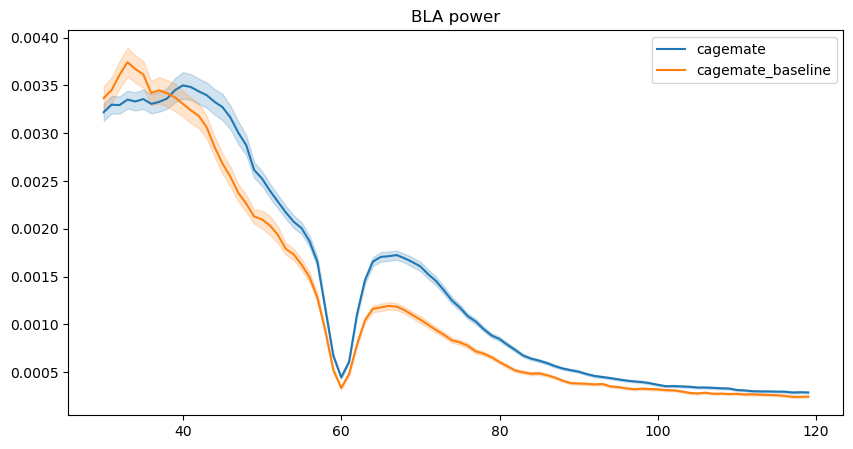

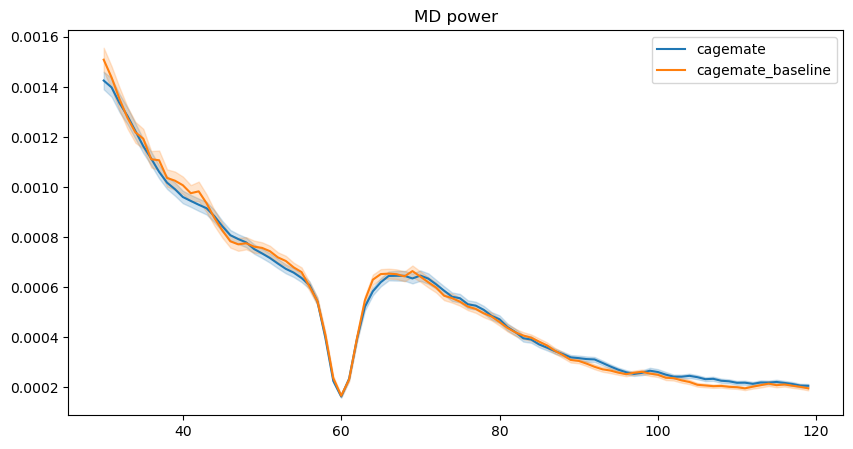

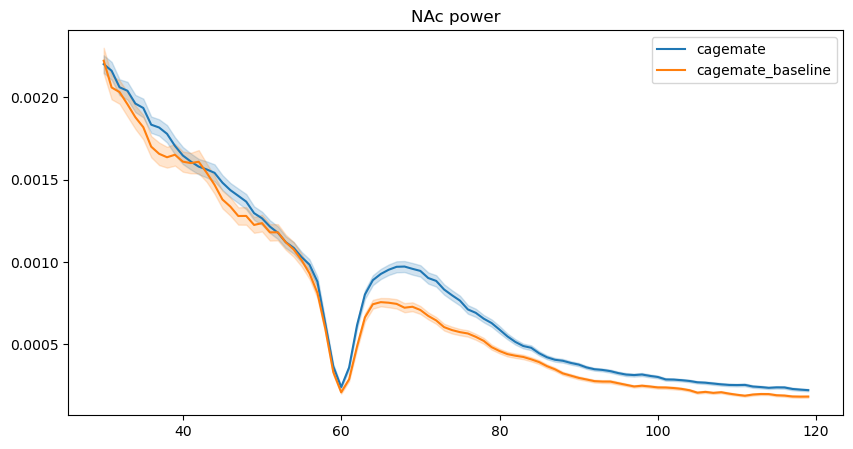

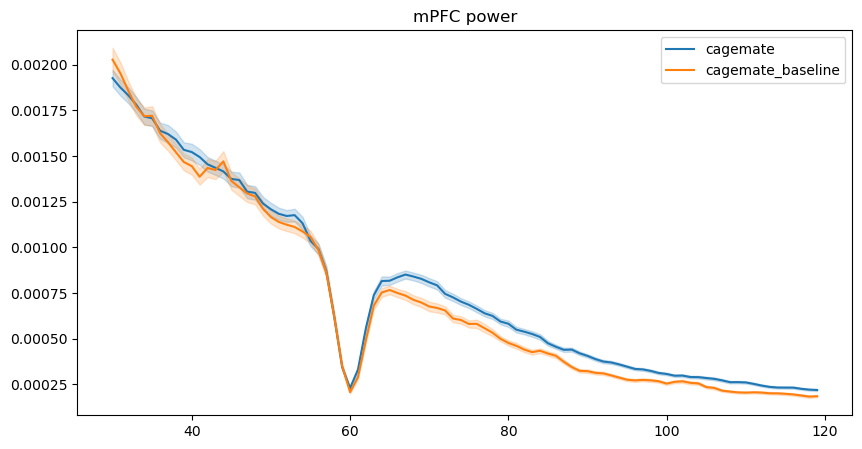

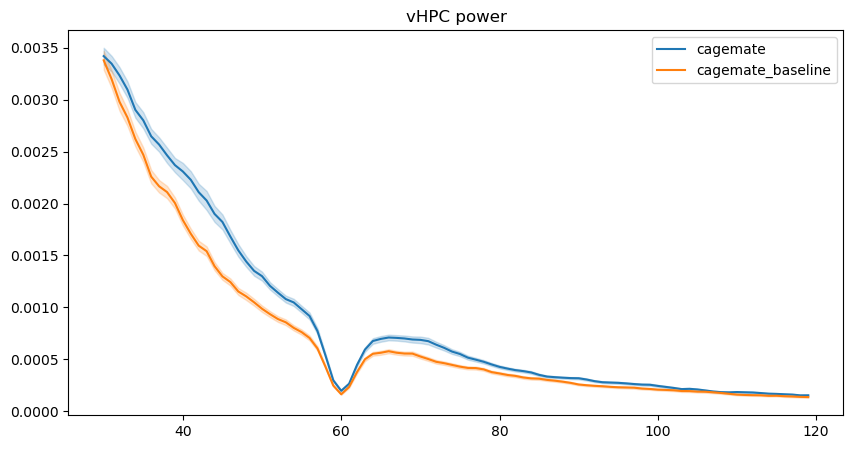

{'cagemate': [array([[5.95250855e-03, 6.26824165e-03, 1.02110006e-02, 3.76066499e-03,
          2.08268714e-03],
         [6.45844982e-03, 9.66568705e-03, 1.22416118e-02, 7.56713519e-03,
          8.59438695e-03],
         [1.05315664e-02, 1.70590450e-02, 3.71220173e-02, 1.04389622e-02,
          2.33928825e-02],
         ...,
         [2.70923987e-07, 4.09580653e-08, 1.35611840e-08, 8.98184992e-09,
          1.15293082e-07],
         [2.58750898e-07, 3.87722170e-08, 1.01960318e-08, 1.18985283e-08,
          1.14123642e-07],
         [2.66761940e-07, 3.81992287e-08, 1.49451532e-08, 7.66393410e-09,
          1.12308936e-07]], shape=(500, 5)),
  array([[3.63772318e-03, 5.04153260e-03, 7.70752289e-03, 5.08830762e-03,
          2.29640326e-03],
         [4.50263075e-03, 8.98701988e-03, 1.13573256e-02, 6.26515602e-03,
          4.18622802e-03],
         [1.01408668e-02, 1.67560867e-02, 1.87759159e-02, 1.21685145e-02,
          7.79413757e-03],
         ...,
         [1.02967784e-07, 7.08395

In [49]:
reload(lfpa)
lfpa.average_events(cups_collection,events=['cagemate', 'cagemate_baseline'], mode = 'power', plot = True, freq_range = (30,120))

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  
/scratch/local/62760436/ipykernel_2592129/3318478903.py:56: RuntimeWarning: Mean of empty slice
  average_event = np.nanmean(np.array(all_events), axis=0)


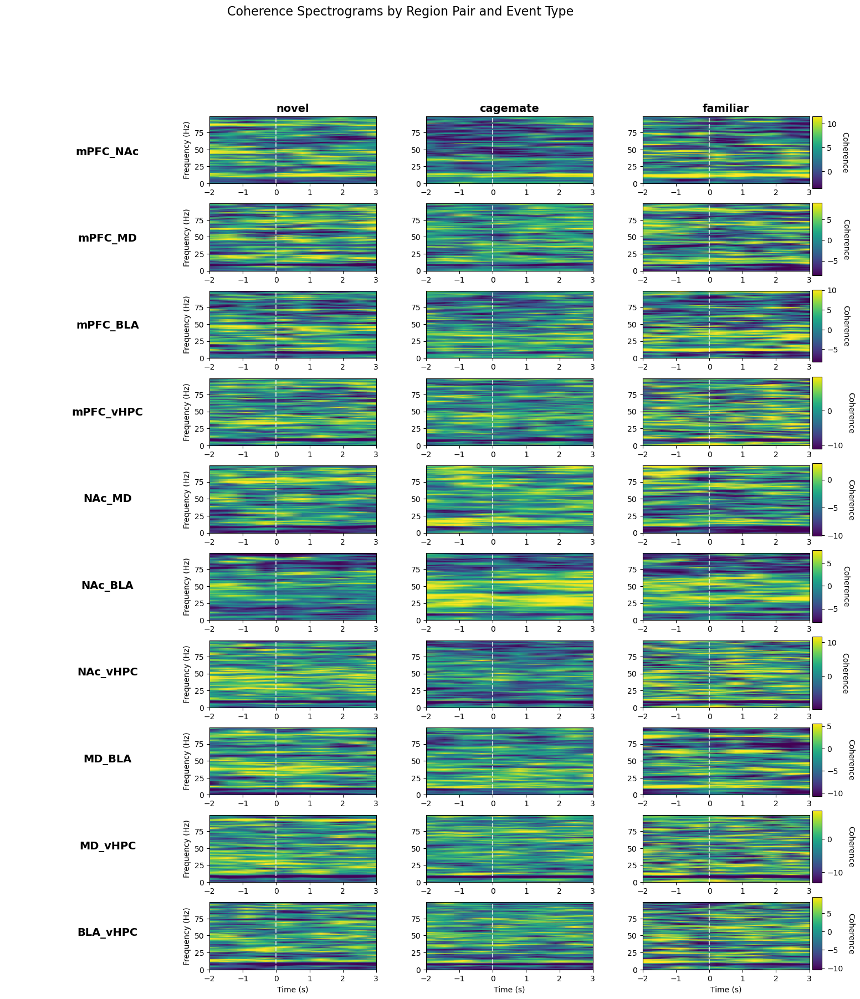

In [43]:
def plot_coherence_causality(lfp_collection, events, mode, event_len, measure_type="coherence", baseline=None, pre_window=0, post_window=0, freq_range=(0,100)):
    """
    Plot coherence or Granger causality spectrograms for unique combinations of brain regions.
    
    Parameters:
    -----------
    lfp_collection : LFPCollection or LFPRecording
        Collection of LFP recordings or a single recording
    events : list
        List of event types to analyze
    mode : str
        Analysis mode
    event_len : float
        Duration of event in seconds
    measure_type : str
        Type of measure to plot ('coherence' or 'granger')
    baseline : str, optional
        Baseline event type for normalization
    pre_window : float, optional
        Time before event onset to include
    post_window : float, optional
        Time after event end to include
    freq_range : tuple, optional
        Range of frequencies to plot (min, max)
    """
    # Process collection vs single recording
    if isinstance(lfp_collection, LFPCollection):
        recordings = lfp_collection.lfp_recordings
    elif isinstance(lfp_collection, LFPRecording):
        recordings = [lfp_collection]
    else:
        raise TypeError("lfp_collection must be either LFPCollection or LFPRecording")
    
    # Dictionary to store the average event data for each event type
    event_averages_dict = {}
    
    # Process each event type
    for i in range(len(events)):
        all_events = []
        for recording in recordings:
            # Events shape: [trials, time, freq, regions, regions]
            recording_events = lfpa.__get_events__(recording, events[i], mode, event_len, 
                                                  pre_window, post_window, average=False)
            
            if baseline is not None:
                # TODO: edit this to work with not averages 
                adj_averages = lfpa.__baseline_diff__(
                    recording, recording_events, baseline[i], mode, event_len, 
                    pre_window=0, post_window=0, average = False
                )
                all_events.extend(adj_averages)
            else:
                all_events.extend(recording_events)
        
        # Calculate average across trials for this event type
        average_event = np.nanmean(np.array(all_events), axis=0)
        event_averages_dict[events[i]] = average_event
    
    # Get dimensions and axes from the first event
    first_event = list(event_averages_dict.values())[0]
    n_timepoints, n_freqs, n_regions, _ = first_event.shape
    time_axis = np.linspace(-pre_window, event_len+post_window, n_timepoints)
    freq_axis = range(freq_range[0], freq_range[1])
    
    # Get region names
    region_names = [f'{cups_collection.brain_region_dict.inverse[i]}' for i in range(n_regions)]
    
    # Generate unique region pairs (no self-pairs, only one direction)
    region_pairs = []
    region_pair_indices = []
    
    for i in range(n_regions):
        for j in range(i+1, n_regions):  # Start from i+1 to avoid self-pairs and duplicates
            region_pairs.append(f"{region_names[i]}_{region_names[j]}")
            region_pair_indices.append((i, j))
    
    n_pairs = len(region_pairs)
    
    # Calculate vmin and vmax per region pair across all events
    pair_bounds = []
    for pair_idx, (region_i, region_j) in enumerate(region_pair_indices):
        # Collect data for this region pair across all events
        pair_data = np.array([])
        for event_data in event_averages_dict.values():
            # Extract only the frequency range we want to display
            sliced_data = event_data[:, freq_range[0]:freq_range[1], region_i, region_j]
            if pair_data.size == 0:
                pair_data = sliced_data.flatten()
            else:
                pair_data = np.concatenate([pair_data, sliced_data.flatten()])
        
        # Calculate percentiles for this pair's data
        pair_vmin = np.percentile(pair_data, 5)
        pair_vmax = np.percentile(pair_data, 95)
        
        # Store bounds for this pair
        pair_bounds.append((pair_vmin, pair_vmax))
    
    # Setup figure layout - rows are region pairs, columns are event types
    n_rows = n_pairs
    n_cols = len(events)
    
    # Adjust figure size based on number of subplots
    fig_size = (15, 10)
    adjusted_width = max(fig_size[0], 4 * n_cols)
    adjusted_height = max(fig_size[1], 2 * n_rows)  # Increase height for more region pairs
    
    # Create figure with extra space for everything
    fig = plt.figure(figsize=(adjusted_width + 4, adjusted_height))
    
    # Create layout with extra space for labels and colorbars
    # Main gridspec for all content
    outer_gs = fig.add_gridspec(1, 2, width_ratios=[0.25, 0.75], wspace=0.0)  # Wider left side for longer pair labels
    
    # Left side for region pair labels
    labels_gs = outer_gs[0].subgridspec(n_rows, 1)
    
    # Right side for plots and colorbars
    right_gs = outer_gs[1].subgridspec(1, 2, width_ratios=[0.985, 0.015], wspace=0.01)
    
    # Further divide the plots area into a grid for each region pair and event
    plots_gs = right_gs[0].subgridspec(n_rows, n_cols, hspace=0.3, wspace=0.3)
    
    # And the colorbar area into a column for each region pair
    cbar_gs = right_gs[1].subgridspec(n_rows, 1)
    
    # Create axes
    label_axes = []
    plot_axes = []
    cbar_axes = []
    
    # Create label axes
    for row_idx in range(n_rows):
        label_ax = fig.add_subplot(labels_gs[row_idx, 0])
        label_ax.axis('off')  # Hide axis elements
        label_axes.append(label_ax)
    
    # Create plot axes
    for row_idx in range(n_rows):
        row_axes = []
        for col_idx in range(n_cols):
            ax = fig.add_subplot(plots_gs[row_idx, col_idx])
            row_axes.append(ax)
        plot_axes.append(row_axes)
    
    # Create colorbar axes
    for row_idx in range(n_rows):
        cbar_ax = fig.add_subplot(cbar_gs[row_idx, 0])
        cbar_axes.append(cbar_ax)
    
    # Add the region pair labels
    for row_idx, pair_name in enumerate(region_pairs):
        label_axes[row_idx].text(0.5, 0.5, pair_name,
                                 fontsize=14, fontweight='bold',
                                 rotation=0, ha='center', va='center',
                                 transform=label_axes[row_idx].transAxes)
    
    # Plot spectrograms and add colorbars
    for row_idx, (region_i, region_j) in enumerate(region_pair_indices):
        pair_vmin, pair_vmax = pair_bounds[row_idx]
        
        # Reference to store the last image for colorbar
        pair_im = None
        
        # Plot each event for this region pair
        for col_idx, event in enumerate(events):
            ax = plot_axes[row_idx][col_idx]
            
            # Get the event data for this specific region pair
            event_data = event_averages_dict[event][:, freq_range[0]:freq_range[1], region_i, region_j].T
            
            # Plot the spectrogram
            im = ax.pcolormesh(time_axis, freq_axis, event_data,
                              cmap='viridis', vmin=pair_vmin, vmax=pair_vmax, shading='gouraud')
            
            pair_im = im  # Save for colorbar
            
            # Add vertical line at t=0 (event onset)
            ax.axvline(x=0, color='white', linestyle='--', alpha=0.7)
            
            # Set labels only on left and bottom edges
            if col_idx == 0:
                ax.set_ylabel('Frequency (Hz)')
            
            if row_idx == n_rows - 1:
                ax.set_xlabel('Time (s)')
            
            # Add event type title
            if row_idx == 0:
                ax.set_title(f"{event}", fontsize=14, fontweight='bold')
        
        # Add colorbar for this region pair
        if pair_im is not None:
            cbar = plt.colorbar(pair_im, cax=cbar_axes[row_idx])
            measure_label = "Coherence" if mode == "coherence" else "Granger Causality"
            cbar.set_label(measure_label, rotation=270, labelpad=15)
    
    # Add overall title
    measure_title = "Coherence" if mode == "coherence" else "Granger Causality"
    fig.suptitle(f'{measure_title} Spectrograms by Region Pair and Event Type', fontsize=16, y=0.98)
    
plot_coherence_causality(cups_collection,events = ['novel', 'cagemate', 'familiar'], baseline = ['novel_baseline', 'cagemate_baseline','familiar_baseline'], mode = 'coherence', event_len = 3, pre_window = 2, freq_range = (0, 100))

/scratch/local/62760436/ipykernel_2592129/2333758742.py:56: RuntimeWarning: Mean of empty slice
  average_event = np.nanmean(np.array(all_events), axis=0)


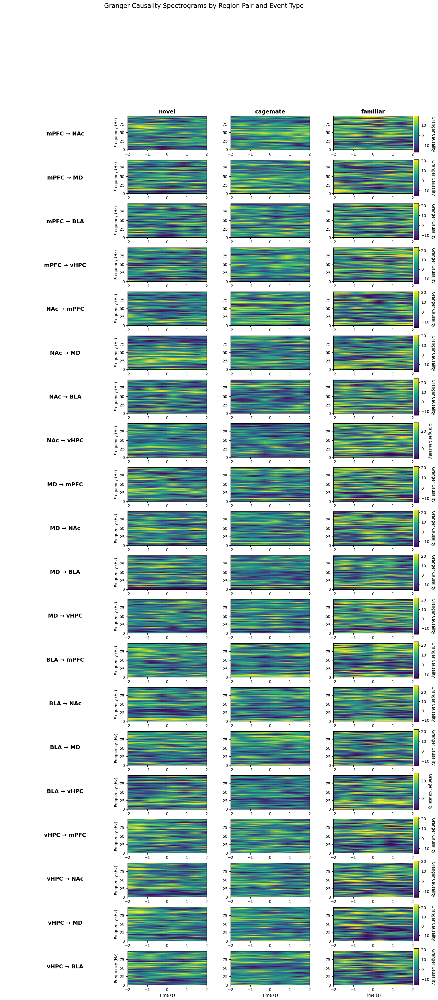

In [44]:
def plot_coherence_causality(lfp_collection, events, mode, event_len, baseline=None, pre_window=0, post_window=0, freq_range=(0,100)):
    """
    Plot coherence or Granger causality spectrograms for unique combinations of brain regions.
    
    Parameters:
    -----------
    lfp_collection : LFPCollection or LFPRecording
        Collection of LFP recordings or a single recording
    events : list
        List of event types to analyze
    mode : str
        Analysis mode
    event_len : float
        Duration of event in seconds
    measure_type : str
        Type of measure to plot ('coherence' or 'granger')
    baseline : str, optional
        Baseline event type for normalization
    pre_window : float, optional
        Time before event onset to include
    post_window : float, optional
        Time after event end to include
    freq_range : tuple, optional
        Range of frequencies to plot (min, max)
    """
    # Process collection vs single recording
    if isinstance(lfp_collection, LFPCollection):
        recordings = lfp_collection.lfp_recordings
    elif isinstance(lfp_collection, LFPRecording):
        recordings = [lfp_collection]
    else:
        raise TypeError("lfp_collection must be either LFPCollection or LFPRecording")
    
    # Dictionary to store the average event data for each event type
    event_averages_dict = {}
    
    # Process each event type
    for i in range(len(events)):
        all_events = []
        for recording in recordings:
            # Events shape: [trials, time, freq, regions, regions]
            recording_events = lfpa.__get_events__(recording, events[i], mode, event_len, 
                                                  pre_window, post_window, average=False)
            
            if baseline is not None:
                # TODO: edit this to work with not averages 
                adj_averages = lfpa.__baseline_diff__(
                    recording, recording_events, baseline[i], mode, event_len, 
                    pre_window=0, post_window=0, average = False
                )
                all_events.extend(adj_averages)
            else:
                all_events.extend(recording_events)
        
        # Calculate average across trials for this event type
        average_event = np.nanmean(np.array(all_events), axis=0)
        event_averages_dict[events[i]] = average_event
    
    # Get dimensions and axes from the first event
    first_event = list(event_averages_dict.values())[0]
    n_timepoints, n_freqs, n_regions, _ = first_event.shape
    time_axis = np.linspace(-pre_window, event_len+post_window, n_timepoints)
    freq_axis = range(freq_range[0], freq_range[1])
    
    # Get region names
    region_names = [f'{cups_collection.brain_region_dict.inverse[i]}' for i in range(n_regions)]
    
    # Generate region pairs based on measure type
    region_pairs = []
    region_pair_indices = []
    
    if mode == "coherence":
        # For coherence: unique pairs only (no self-pairs, only one direction)
        for i in range(n_regions):
            for j in range(i+1, n_regions):  # Start from i+1 to avoid self-pairs and duplicates
                region_pairs.append(f"{region_names[i]}_{region_names[j]}")
                region_pair_indices.append((i, j))
    else:  # Granger causality
        # For Granger: all directed pairs (no self-pairs, both directions)
        for i in range(n_regions):
            for j in range(n_regions):
                if i != j:  # Skip self-pairs
                    region_pairs.append(f"{region_names[i]} → {region_names[j]}")
                    region_pair_indices.append((i, j))
    
    n_pairs = len(region_pairs)
    
    # Calculate vmin and vmax per region pair across all events
    pair_bounds = []
    for pair_idx, (region_i, region_j) in enumerate(region_pair_indices):
        # Collect data for this region pair across all events
        pair_data = np.array([])
        for event_data in event_averages_dict.values():
            # Extract only the frequency range we want to display
            sliced_data = event_data[:, freq_range[0]:freq_range[1], region_i, region_j]
            if pair_data.size == 0:
                pair_data = sliced_data.flatten()
            else:
                pair_data = np.concatenate([pair_data, sliced_data.flatten()])
        
        # Calculate percentiles for this pair's data
        pair_vmin = np.percentile(pair_data, 5)
        pair_vmax = np.percentile(pair_data, 95)
        
        # Store bounds for this pair
        pair_bounds.append((pair_vmin, pair_vmax))
    
    # Setup figure layout - rows are region pairs, columns are event types
    n_rows = n_pairs
    n_cols = len(events)
    
    # Adjust figure size based on number of subplots
    fig_size = (15, 10)
    adjusted_width = max(fig_size[0], 4 * n_cols)
    adjusted_height = max(fig_size[1], 2 * n_rows)  # Increase height for more region pairs
    
    # Create figure with extra space for everything
    fig = plt.figure(figsize=(adjusted_width + 4, adjusted_height))
    
    # Create layout with extra space for labels and colorbars
    # Main gridspec for all content
    # For Granger causality we need more space for directional labels
    label_width_ratio = 0.3 if mode == "granger" else 0.25
    outer_gs = fig.add_gridspec(1, 2, width_ratios=[label_width_ratio, 1-label_width_ratio], wspace=0.0)
    
    # Left side for region pair labels
    labels_gs = outer_gs[0].subgridspec(n_rows, 1)
    
    # Right side for plots and colorbars
    right_gs = outer_gs[1].subgridspec(1, 2, width_ratios=[0.985, 0.015], wspace=0.01)
    
    # Further divide the plots area into a grid for each region pair and event
    plots_gs = right_gs[0].subgridspec(n_rows, n_cols, hspace=0.3, wspace=0.3)
    
    # And the colorbar area into a column for each region pair
    cbar_gs = right_gs[1].subgridspec(n_rows, 1)
    
    # Create axes
    label_axes = []
    plot_axes = []
    cbar_axes = []
    
    # Create label axes
    for row_idx in range(n_rows):
        label_ax = fig.add_subplot(labels_gs[row_idx, 0])
        label_ax.axis('off')  # Hide axis elements
        label_axes.append(label_ax)
    
    # Create plot axes
    for row_idx in range(n_rows):
        row_axes = []
        for col_idx in range(n_cols):
            ax = fig.add_subplot(plots_gs[row_idx, col_idx])
            row_axes.append(ax)
        plot_axes.append(row_axes)
    
    # Create colorbar axes
    for row_idx in range(n_rows):
        cbar_ax = fig.add_subplot(cbar_gs[row_idx, 0])
        cbar_axes.append(cbar_ax)
    
    # Add the region pair labels
    for row_idx, pair_name in enumerate(region_pairs):
        label_axes[row_idx].text(0.5, 0.5, pair_name,
                                 fontsize=14, fontweight='bold',
                                 rotation=0, ha='center', va='center',
                                 transform=label_axes[row_idx].transAxes)
    
    # Plot spectrograms and add colorbars
    for row_idx, (region_i, region_j) in enumerate(region_pair_indices):
        pair_vmin, pair_vmax = pair_bounds[row_idx]
        
        # Reference to store the last image for colorbar
        pair_im = None
        
        # Plot each event for this region pair
        for col_idx, event in enumerate(events):
            ax = plot_axes[row_idx][col_idx]
            
            # Get the event data for this specific region pair
            event_data = event_averages_dict[event][:, freq_range[0]:freq_range[1], region_i, region_j].T
            
            # Plot the spectrogram
            im = ax.pcolormesh(time_axis, freq_axis, event_data,
                              cmap='viridis', vmin=pair_vmin, vmax=pair_vmax, shading='gouraud')
            
            pair_im = im  # Save for colorbar
            
            # Add vertical line at t=0 (event onset)
            ax.axvline(x=0, color='white', linestyle='--', alpha=0.7)
            
            # Set labels only on left and bottom edges
            if col_idx == 0:
                ax.set_ylabel('Frequency (Hz)')
            
            if row_idx == n_rows - 1:
                ax.set_xlabel('Time (s)')
            
            # Add event type title
            if row_idx == 0:
                ax.set_title(f"{event}", fontsize=14, fontweight='bold')
        
        # Add colorbar for this region pair
        if pair_im is not None:
            cbar = plt.colorbar(pair_im, cax=cbar_axes[row_idx])
            measure_label = "Coherence" if mode == "coherence" else "Granger Causality"
            cbar.set_label(measure_label, rotation=270, labelpad=15)
    
    # Add overall title
    measure_title = "Coherence" if mode == "coherence" else "Granger Causality"
    fig.suptitle(f'{measure_title} Spectrograms by Region Pair and Event Type', fontsize=16, y=0.98)
    
plot_coherence_causality(cups_collection,events = ['novel', 'cagemate', 'familiar'], baseline = ['novel_baseline', 'cagemate_baseline','familiar_baseline'], mode = 'granger', event_len = 2, pre_window = 2, freq_range = (0, 100))

In [7]:

def plot_averages(power_dict, lfp_collection,colors, bar_width = None):
    # Get the single event (assuming one event in all conditions)
    first_condition = list(power_dict.keys())[0]
    #event = list(power_dict[first_condition].keys())[0]
   
    # Process data for each condition
    condition_data = {}
    for condition, powers in power_dict.items():
        [unflipped, flipped] = lfpa.band_calcs(powers)
        brain_regions = np.empty(len(lfp_collection.brain_region_dict.keys()), dtype="<U10")
        for i in range(len(lfp_collection.brain_region_dict.keys())):
            brain_regions[i] = lfp_collection.brain_region_dict.inverse[i]
            
        avg_values = {key: {subset: [] for subset in brain_regions} for key in flipped.keys()}
        sem_values = {key: {subset: [] for subset in brain_regions} for key in flipped.keys()}
    
        event = list(unflipped.keys())[0]
        
        for key in flipped.keys():
            for i, subset in enumerate(brain_regions):
                avg_values[key][subset] = np.nanmean(flipped[key][event][:, i])
                sem_values[key][subset] = stats.sem(flipped[key][event][:, i], nan_policy="omit")
                    
        condition_data[condition] = {'avg': avg_values, 'sem': sem_values}
    
    # Plotting
    # Calculate number of subplots needed (one per frequency band)
    freq_bands = list(flipped.keys())
    n_bands = len(freq_bands)
    n_rows = (n_bands + 1) // 2  # 2 plots per row, rounded up
    
    
   
    
    # Plotting parameters
    if bar_width is None:
        bar_width = 0.35
    conditions = list(power_dict.keys())
    fig, axs = plt.subplots(n_rows, 2, figsize=(7.5*len(conditions), 5*n_rows))
    fig.suptitle(f"Average Power by Frequency Band", fontsize=24, y = 1.1)
    axs = axs.ravel()  # Flatten axes array for easier indexing
    for i, band in enumerate(freq_bands):
        ax = axs[i]
        x = np.arange(len(brain_regions))
        
        for j, condition in enumerate(conditions):
            positions = x + (j - len(conditions)/2 + 0.5) * bar_width
            ax.bar(positions,
                  [condition_data[condition]['avg'][band][region] for region in brain_regions],
                  width=bar_width,
                  yerr=[condition_data[condition]['sem'][band][region] for region in brain_regions],
                  capsize=5,
                  linewidth=2,
                  error_kw={"elinewidth": 2, "capthick": 2},
                  label=condition,
                  color=colors[j],
                  edgecolor = 'black')  # Add hatching for second condition
        
        ax.set_title(band, fontsize=20)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_linewidth(2)
        ax.spines['left'].set_linewidth(2)
        ax.axhline(y=0, color="black", linestyle="--", alpha=0.8)
        ax.tick_params(axis='both', which='major', labelsize=14)
        ax.set_xticks(x+.25)
        ax.set_xticklabels(brain_regions, rotation=0, ha='right', fontsize = 18)
        ax.set_ylabel('Power', fontsize = 18)
        #if i == 0:  # Add legend to first subplot
        ax.legend(fontsize=14, frameon=False, bbox_to_anchor = (1,1))
        ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
        ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
        ax.yaxis.get_offset_text().set_fontsize(14) 
    # Remove empty subplots
    for i in range(len(freq_bands), len(axs)):
        fig.delaxes(axs[i])
        
    plt.tight_layout()
    plt.show()


def plot_coherence_bar(coherence_dict, lfp_collection, colors, bar_width = None):
    # Get the single event (assuming one event in all conditions)
    first_condition = list(coherence_dict.keys())[0]
    event = list(coherence_dict[first_condition].keys())[0]
    
    # Get brain region pairs
    region_dict = lfp_collection.brain_region_dict
    brain_regions = list(combinations(list((region_dict.keys())), 2))
    
    # Process data for each condition
    condition_data = {}
    for condition, coherences in coherence_dict.items():
        [unflipped, flipped] = lfpa.band_calcs(coherences)
        
        avg_values = {key: {subset: [] for subset in brain_regions} for key in flipped.keys()}
        sem_values = {key: {subset: [] for subset in brain_regions} for key in flipped.keys()}
        event = list(unflipped.keys())[0]
        
        for key in flipped.keys():
            for i, subset in enumerate(brain_regions):
                pair_index_1 = region_dict[brain_regions[i][0]]
                pair_index_2 = region_dict[brain_regions[i][1]]
                avg_values[key][subset] = np.nanmean(flipped[key][event][:, pair_index_1, pair_index_2])
                sem_values[key][subset] = stats.sem(
                    flipped[key][event][:, pair_index_1, pair_index_2], 
                    nan_policy="omit"
                )
                    
        condition_data[condition] = {'avg': avg_values, 'sem': sem_values}
    
    # Plotting
    # Calculate number of subplots needed (one per frequency band)
    freq_bands = list(flipped.keys())
    n_bands = len(freq_bands)
    n_rows = (n_bands + 1) // 2  # 2 plots per row, rounded up
    conditions = list(coherence_dict.keys())
    fig, axs = plt.subplots(n_rows, 2, figsize=(10*len(conditions), 5*n_rows))
    fig.suptitle(f"Average Coherence by Frequency Band", fontsize=24, y =1.05)
    axs = axs.ravel()  # Flatten axes array for easier indexing
    
    # Plotting parameters
    if bar_width is None:
        bar_width = 0.35
    
    
    for i, band in enumerate(freq_bands):
        ax = axs[i]
        x = np.arange(len(brain_regions))
        
        for j, condition in enumerate(conditions):
            positions = x + (j - len(conditions)/2 + 0.5) * bar_width
            ax.bar(positions,
                  [condition_data[condition]['avg'][band][region] for region in brain_regions],
                  width=bar_width,
                  yerr=[condition_data[condition]['sem'][band][region] for region in brain_regions],
                  capsize=5,
                  linewidth=2,
                  error_kw={"elinewidth": 2, "capthick": 2},
                  label=condition,
                  color=colors[j],
                  edgecolor = 'black')  # Add hatching for second condition
        
        ax.set_title(band, fontsize=20, y = 1.1)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_linewidth(2)
        ax.spines['left'].set_linewidth(2)
        ax.axhline(y=0, color="black", linestyle="--", alpha=0.8)
        ax.tick_params(axis='both', which='major', labelsize=14)
        ax.set_xticks(x)
        # Format brain region pair labels
        region_labels = [f"{pair[0]}-{pair[1]}" for pair in brain_regions]
        ax.set_xticklabels(region_labels, rotation=45, ha='right')
        
        #if i == 0:  # Add legend to first subplot
        ax.legend(fontsize=14, frameon=False, bbox_to_anchor=(1,1))
            
        ax.set_ylabel("Coherence", fontsize = 18)
        #ax.set_ylim(.3,1)
    # Remove empty subplots
    for i in range(len(freq_bands), len(axs)):
        fig.delaxes(axs[i])
        
    plt.tight_layout()
    plt.show()

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:411: RuntimeWarning: Mean of empty slice
  delta = np.nanmean(calculations[:, 0:4, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:412: RuntimeWarning: Mean of empty slice
  theta = np.nanmean(calculations[:, 4:13, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:414: RuntimeWarning: Mean of empty slice
  beta = np.nanmean(calculations[:, 13:31, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:416: RuntimeWarning: Mean of empty slice
  low_gamma = np.nanmean(calculations[:, 31:71, ...],

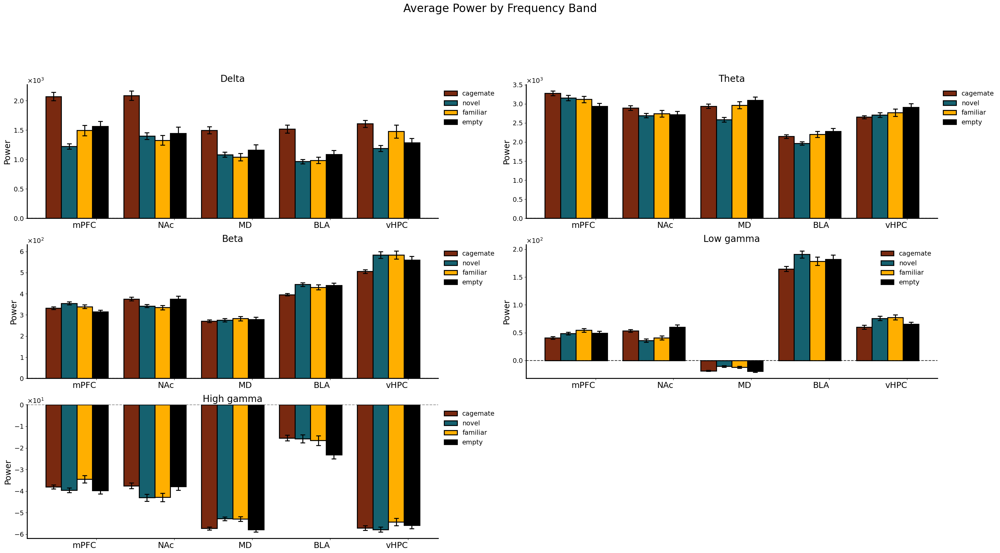

In [8]:
novel_power_averages = lfpa.average_events(cups_collection, events = ['novel'], baseline = 'novel_baseline', mode = 'power', plot = False)
cagemate_power_averages = lfpa.average_events(cups_collection, events = ['cagemate'], baseline = 'cagemate_baseline', mode = 'power', plot = False)
familiar_power_averages = lfpa.average_events(cups_collection, events = ['familiar'], baseline = 'familiar_baseline', mode = 'power', plot = False)
empty_power_averages = lfpa.average_events(cups_collection, events = ['empty'], baseline = 'empty_baseline', mode = 'power', plot = False)
power_dict = {'cagemate':cagemate_power_averages,
              'novel': novel_power_averages, 
              'familiar': familiar_power_averages,
              'empty':empty_power_averages}

colors = ['#792910', '#15616F', (1.0, 0.6862745098039216, 0.0), 'black']
plot_averages(power_dict, cups_collection, colors = colors, bar_width = .2)

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:411: RuntimeWarning: Mean of empty slice
  delta = np.nanmean(calculations[:, 0:4, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:412: RuntimeWarning: Mean of empty slice
  theta = np.nanmean(calculations[:, 4:13, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:414: RuntimeWarning: Mean of empty slice
  beta = np.nanme

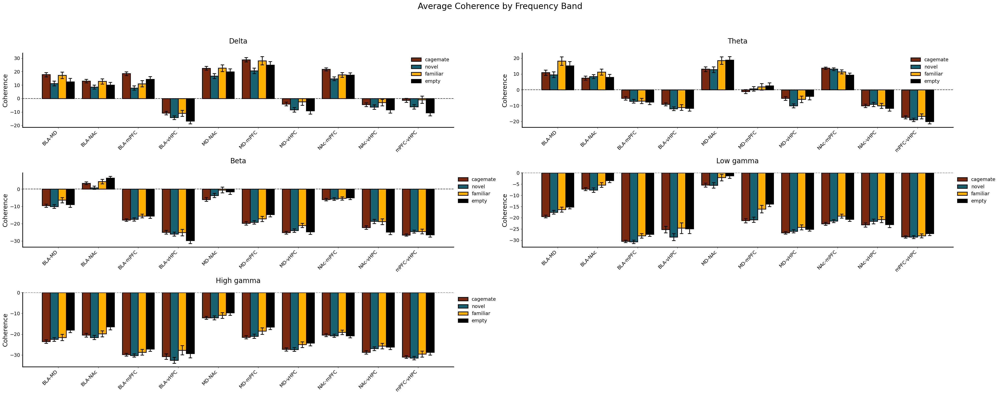

In [9]:
novel_coherence_averages = lfpa.average_events(cups_collection, events = ['novel'], baseline = 'novel_baseline', mode = 'coherence', plot = False)
cagemate_coherence_averages = lfpa.average_events(cups_collection, events = ['cagemate'], baseline = 'cagemate_baseline', mode = 'coherence', plot = False)
familiar_coherence_averages = lfpa.average_events(cups_collection, events = ['familiar'], baseline = 'familiar_baseline', mode = 'coherence', plot = False)
empty_coherence_averages = lfpa.average_events(cups_collection, events = ['empty'], baseline = 'empty_baseline', mode = 'coherence', plot = False)
coherence_dict = {'cagemate':cagemate_coherence_averages,
              'novel': novel_coherence_averages, 
              'familiar': familiar_coherence_averages,
              'empty':empty_coherence_averages}

colors = ['#792910', '#15616F', (1.0, 0.6862745098039216, 0.0), 'black']
plot_coherence_bar(coherence_dict, cups_collection, colors = colors, bar_width = .2)

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:411: RuntimeWarning: Mean of empty slice
  delta = np.nanmean(calculations[:, 0:4, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:412: RuntimeWarning: Mean of empty slice
  theta = np.nanmean(calculations[:, 4:13, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:414: RuntimeWarning: Mean of empty slice
  beta = np.nanme

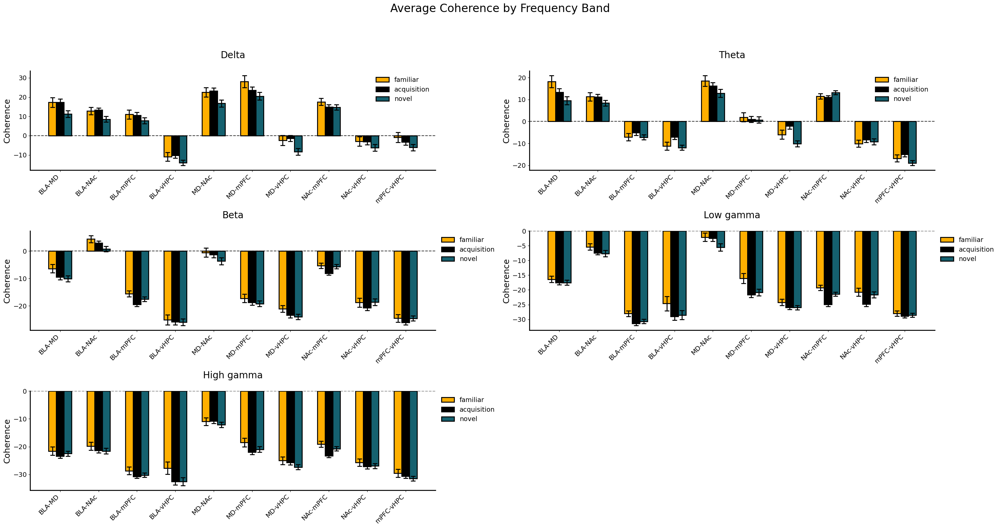

In [10]:
familiar_coherence_averages = lfpa.average_events(cups_collection, events = ['familiar'], baseline = 'familiar_baseline', mode = 'coherence', plot = False)
acquisition_coherence_averages = lfpa.average_events(cups_collection, events = ['acquisition'], baseline = 'familiar_baseline', mode = 'coherence', plot = False)

acq_fam_dict = {'familiar': familiar_coherence_averages,
              'acquisition':acquisition_coherence_averages,
               'novel': novel_coherence_averages}

colors = [(1.0, 0.6862745098039216, 0.0),'black','#15616F']
plot_coherence_bar(acq_fam_dict, cups_collection, colors = colors, bar_width = .2)

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:411: RuntimeWarning: Mean of empty slice
  delta = np.nanmean(calculations[:, 0:4, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:412: RuntimeWarning: Mean of empty slice
  theta = np.nanmean(calculations[:, 4:13, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:414: RuntimeWarning: Mean of empty slice
  beta = np.nanmean(calculations[:, 13:31, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:416: RuntimeWarning: Mean of empty slice
  low_gamma = np.nanmean(calculations[:, 31:71, ...],

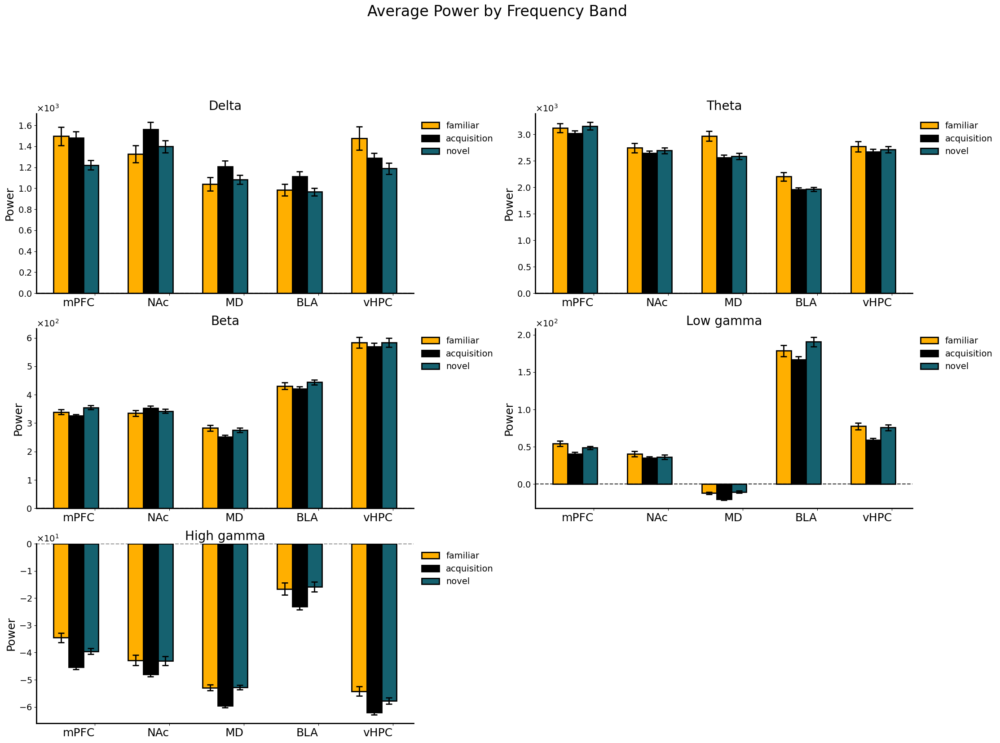

In [11]:
acquisition_power_averages = lfpa.average_events(cups_collection, events = ['acquisition'], baseline = 'familiar_baseline', mode = 'power', plot = False)

acq_fam_dict = {'familiar': familiar_power_averages,
              'acquisition':acquisition_power_averages,
               'novel': novel_power_averages}

colors = [(1.0, 0.6862745098039216, 0.0),'black','#15616F']
plot_averages(acq_fam_dict, cups_collection, colors = colors, bar_width = .2)

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:263: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:265: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


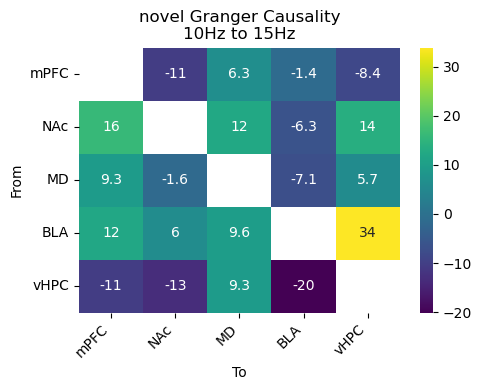

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:263: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:265: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


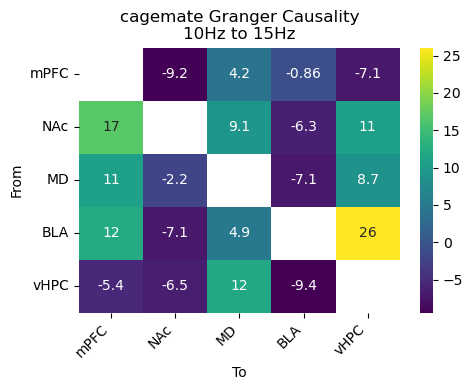

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:263: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:265: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


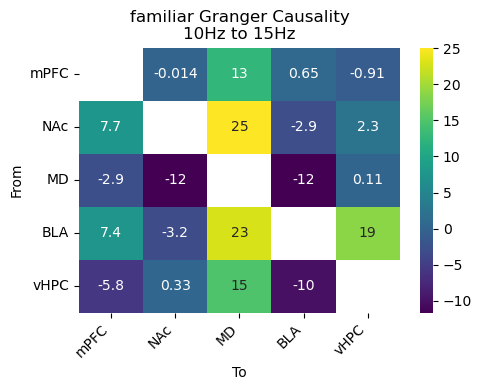

In [12]:
lfpa.plot_granger_heatmap(cups_collection, events =['novel'], baseline = 'novel_baseline', freq = (10,15))
lfpa.plot_granger_heatmap(cups_collection, events =['cagemate'], baseline='cagemate_baseline', freq = (10,15))
lfpa.plot_granger_heatmap(cups_collection, events =['familiar'], baseline='familiar_baseline', freq = (10,15))


/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:263: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:265: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


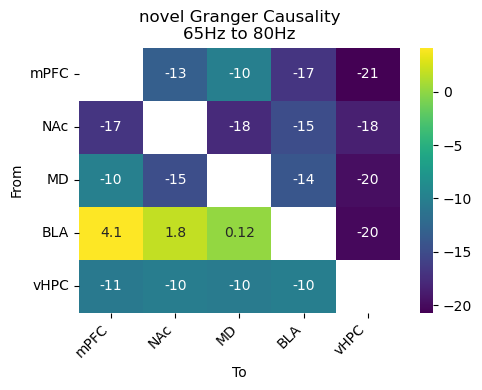

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:263: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:265: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


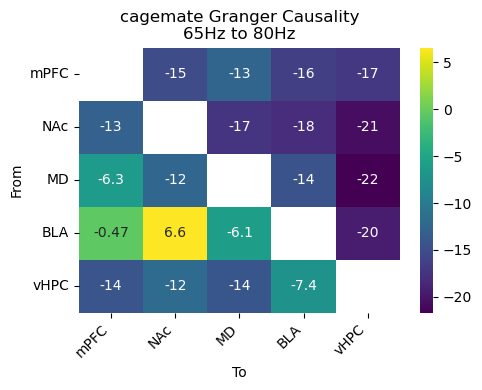

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:263: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:265: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


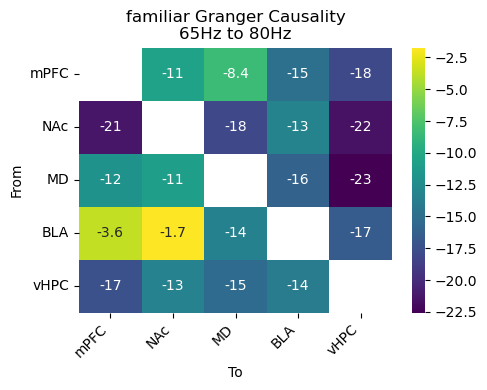

In [13]:
lfpa.plot_granger_heatmap(cups_collection, events =['novel'], baseline = 'novel_baseline', freq = (65,80))
lfpa.plot_granger_heatmap(cups_collection, events =['cagemate'], baseline='cagemate_baseline', freq = (65,80))
lfpa.plot_granger_heatmap(cups_collection, events =['familiar'], baseline='familiar_baseline', freq = (65,80))


/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:263: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:265: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


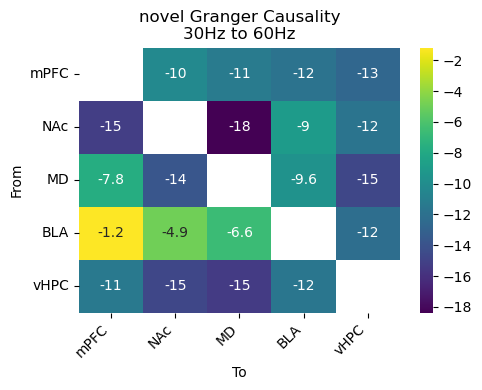

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:263: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:265: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


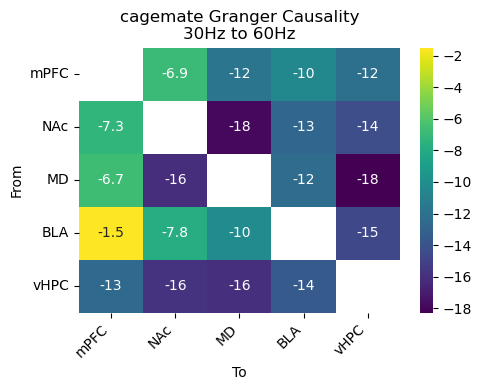

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:263: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:265: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


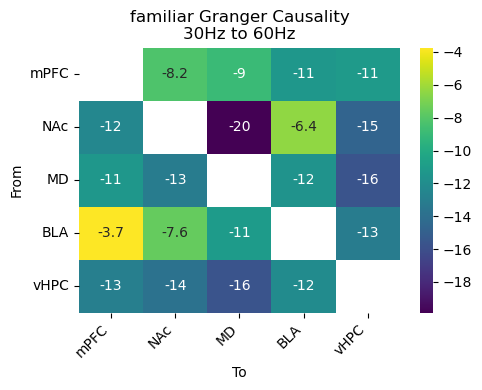

In [14]:
lfpa.plot_granger_heatmap(cups_collection, events =['novel'], baseline = 'novel_baseline', freq = (30,60))
lfpa.plot_granger_heatmap(cups_collection, events =['cagemate'], baseline='cagemate_baseline', freq = (30,60))
lfpa.plot_granger_heatmap(cups_collection, events =['familiar'], baseline='familiar_baseline', freq = (30,60))


In [15]:
def plot_heatmap(lfp_collection, events, freq, color, vmax, baseline= None, event_len = None, mode = 'granger'):
    event_grangers = lfpa.average_events(lfp_collection, events, mode=mode, baseline=baseline, event_len=event_len, plot=False)
    n_events = len(events)
    n_cols = min(3, n_events)  # Max 3 columns
    n_rows = (n_events + n_cols - 1) // n_cols  # Ceiling division
    # Create figure with subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
    if n_events == 1:
        axes = np.array([axes])  # Make single axis iterable
    axes = axes.flatten()  # Flatten for easy iteration
    # Get brain regions once since they're the same for all plots
    brain_regions = np.empty(len(lfp_collection.brain_region_dict.keys()), dtype="<U10")
    for i in range(len(lfp_collection.brain_region_dict.keys())):
        brain_regions[i] = lfp_collection.brain_region_dict.inverse[i]
    for idx, (event, ax) in enumerate(zip(events, axes)):
        event_granger = event_grangers[event]
        avg_granger = np.nanmean(event_granger, axis=0)
        freq_granger = avg_granger[freq[0] : freq[1], :, :]
        avg_freq = np.nanmean(freq_granger, axis=0)
        cmap = LinearSegmentedColormap.from_list('custom', color, N=100)
        sns.heatmap(avg_freq, xticklabels=brain_regions, yticklabels=brain_regions, annot=True, cmap=cmap, ax=ax, vmax = vmax)
        ax.set_title(f"{event} Granger Causality\n{freq[0]}Hz to {freq[1]}Hz")
        # Rotate labels for better readability
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
        ax.set_ylabel("From")
        ax.set_xlabel("To")
    # Remove any empty subplots
    for idx in range(len(events), len(axes)):
        fig.delaxes(axes[idx])
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/scratch/local/62760436/ipykernel_2592129/1768522163.py:17: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/62760436/ipykernel_2592129/1768522163.py:19: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


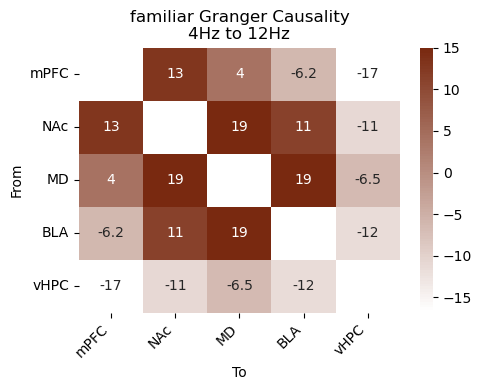

In [16]:
plot_heatmap(cups_collection, events =['familiar'], baseline = 'familiar_baseline', freq = (4,12), color = ['white','#792910'] , vmax = 15, mode = 'coherence')

In [17]:
def plot_heatmap(lfp_collection, events, freq, color, vmax=None, vmin = None, baselines=None, event_len=None,mode = 'granger'):
    """
    Plot Granger causality heatmaps for multiple events as subplots with a shared colorbar per row.
    
    Parameters:
    -----------
    lfp_collection : LFP collection object
    events : list of strings, event names to plot
    freq : tuple, frequency range (min_freq, max_freq)
    color : list of two colors for colormap gradient
    vmax : float, maximum value for colorbar (applied to all plots)
    baselines : optional, list of baseline events corresponding to each event or single baseline for all
    event_len : optional, event length to analyze
    """
    from matplotlib.gridspec import GridSpec
    import numpy as np
    
    # Handle baselines parameter
    if baselines is None:
        # No baselines specified, use None for all events
        event_baselines = [None] * len(events)
    elif isinstance(baselines, list) and len(baselines) == len(events):
        # List of baselines matching events
        event_baselines = baselines
    else:
        # Single baseline for all events
        event_baselines = [baselines] * len(events)
    
    # Calculate Granger causality for each event with its corresponding baseline
    event_grangers = {}
    for event, baseline in zip(events, event_baselines):
        event_data = lfpa.average_events(
            lfp_collection, [event], mode=mode, 
            baseline=baseline, event_len=event_len, plot=False
        )
        event_grangers[event] = event_data[event]
    
    n_events = len(events)
    n_cols = min(3, n_events)  # Max 3 columns
    n_rows = (n_events + n_cols - 1) // n_cols  # Ceiling division
    
    # Create custom grid to accommodate colorbars
    fig = plt.figure(figsize=(5 * n_cols + 0.5, 4 * n_rows))
    gs = GridSpec(n_rows, n_cols + 1, width_ratios=[1] * n_cols + [0.05])
    
    # Get brain regions once since they're the same for all plots
    brain_regions = np.empty(len(lfp_collection.brain_region_dict.keys()), dtype="<U10")
    for i in range(len(lfp_collection.brain_region_dict.keys())):
        brain_regions[i] = lfp_collection.brain_region_dict.inverse[i]
    
    # Create custom colormap
    cmap = LinearSegmentedColormap.from_list('custom', color, N=100)
    
    # Calculate global vmax if not provided
    if vmax is None:
        all_values = []
        for event in events:
            event_granger = event_grangers[event]
            avg_granger = np.nanmean(event_granger, axis=0)
            freq_granger = avg_granger[freq[0]:freq[1], :, :]
            avg_freq = np.nanmean(freq_granger, axis=0)
            all_values.append(np.nanmax(avg_freq))
        vmax = np.max(all_values)
    if vmin is None:
        all_values = []
        for event in events:
            event_granger = event_grangers[event]
            avg_granger = np.nanmean(event_granger, axis=0)
            freq_granger = avg_granger[freq[0]:freq[1], :, :]
            avg_freq = np.nanmean(freq_granger, axis=0)
            all_values.append(np.nanmin(avg_freq))
        vmin = np.min(all_values)
    # Get all data matrices for consistent color scaling
    data_matrices = []
    for event in events:
        event_granger = event_grangers[event]
        avg_granger = np.nanmean(event_granger, axis=0)
        freq_granger = avg_granger[freq[0]:freq[1], :, :]
        avg_freq = np.nanmean(freq_granger, axis=0)
        data_matrices.append(avg_freq)
    
    # Plot each event
    axes = []
    for idx, event in enumerate(events):
        row = idx // n_cols
        col = idx % n_cols
        
        # Create subplot
        ax = fig.add_subplot(gs[row, col])
        axes.append(ax)
        
        # Get data
        avg_freq = data_matrices[idx]
        
        # Create heatmap without colorbar
        sns.heatmap(avg_freq, xticklabels=brain_regions, yticklabels=brain_regions,
                   annot=True, cmap=cmap, ax=ax, vmax=vmax, vmin=vmin, cbar=False)
        
        # Add baseline information to title if available
        baseline_info = ""
        if event_baselines[idx] is not None:
            baseline_info = f"\nBaseline: {event_baselines[idx]}"
            
        ax.set_title(f"{event} Granger Causality\n{freq[0]}Hz to {freq[1]}Hz{baseline_info}")
        
        # Rotate labels for better readability
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
        ax.set_ylabel("From")
        ax.set_xlabel("To")
        
        # Add colorbar at the end of each row
        if col == n_cols - 1 or idx == len(events) - 1:
            cbar_ax = fig.add_subplot(gs[row, -1])
            plt.colorbar(ax.collections[0], cax=cbar_ax)
    
    # Add overall title
    plt.suptitle(f"Granger Causality Analysis ({freq[0]}-{freq[1]}Hz)", 
                fontsize=16, y=1.02)
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()
   

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:68: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:70: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:77: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:79: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, a

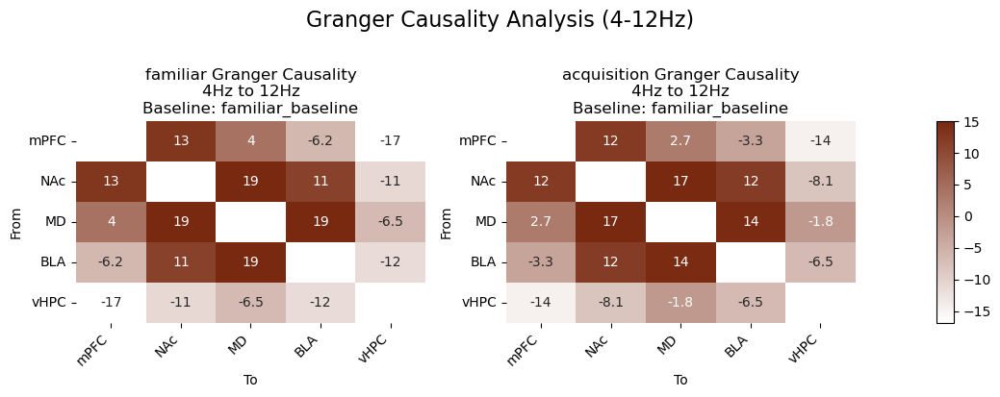

In [18]:
plot_heatmap(cups_collection, events =['familiar', 'acquisition'], baselines = 'familiar_baseline', freq = (4,12), color = ['white','#792910'] , vmax = 15, mode = 'coherence')

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:77: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:79: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


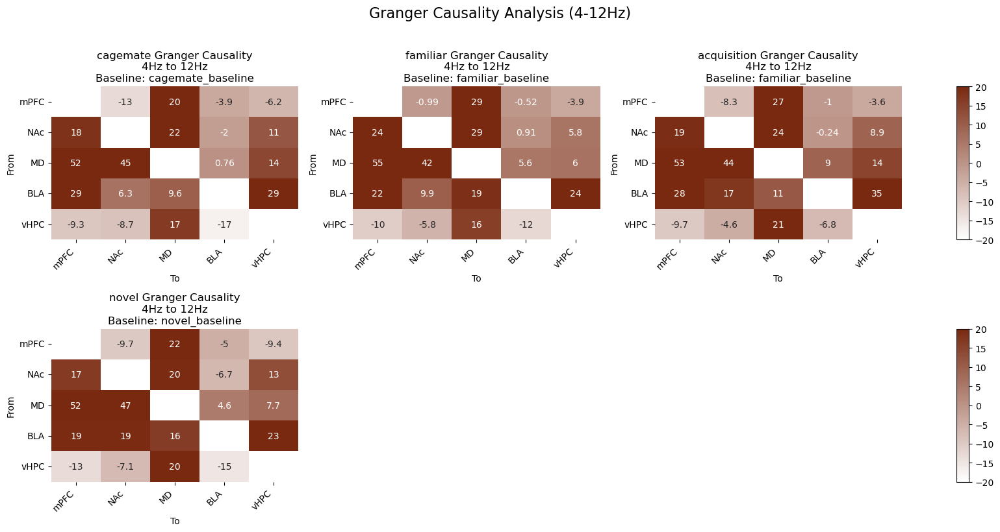

In [19]:
plot_heatmap(cups_collection, events =['cagemate','familiar', 'acquisition', 'novel'],
             baselines = ['cagemate_baseline','familiar_baseline', 'familiar_baseline', 'novel_baseline'],
             freq = (4,12), color = ['white','#792910'] , vmax = 20, vmin = -20, mode = 'granger')

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:77: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:79: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


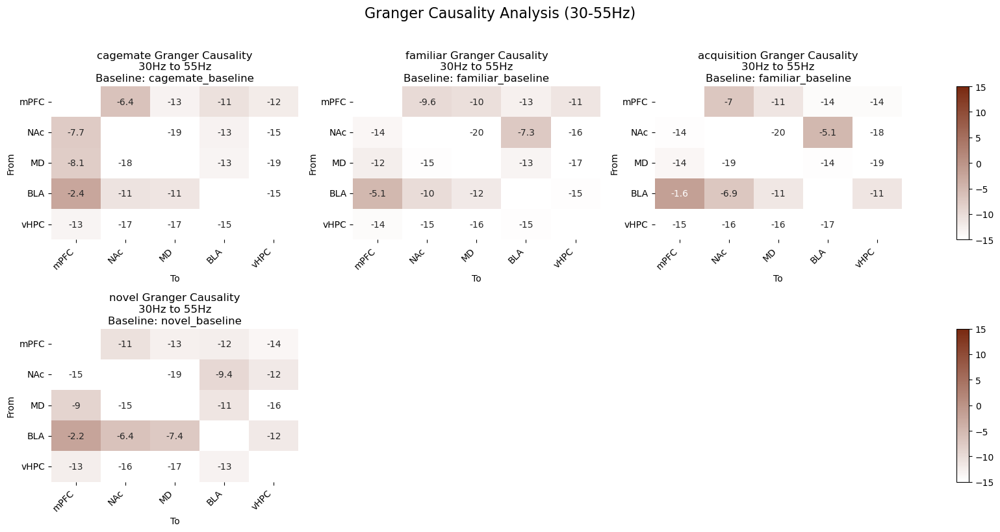

In [20]:
plot_heatmap(cups_collection, events=['cagemate','familiar', 'acquisition', 'novel'],
             baselines = ['cagemate_baseline','familiar_baseline', 'familiar_baseline', 'novel_baseline'],
             freq = (30,55), color = ['white','#792910'] , vmax = 15, vmin = -15, mode = 'granger')

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:77: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:79: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


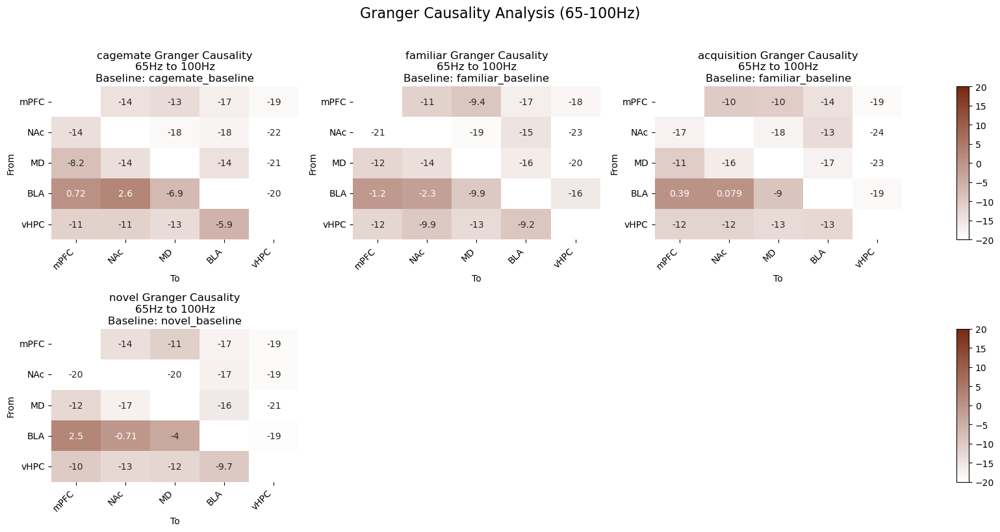

In [21]:
plot_heatmap(cups_collection, events =['cagemate','familiar', 'acquisition', 'novel'],
             baselines = ['cagemate_baseline','familiar_baseline', 'familiar_baseline', 'novel_baseline'],
             freq = (65,100), color = ['white','#792910'] , vmax = 20, vmin = -20, mode = 'granger')

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:59: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:61: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:68: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:70: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, a

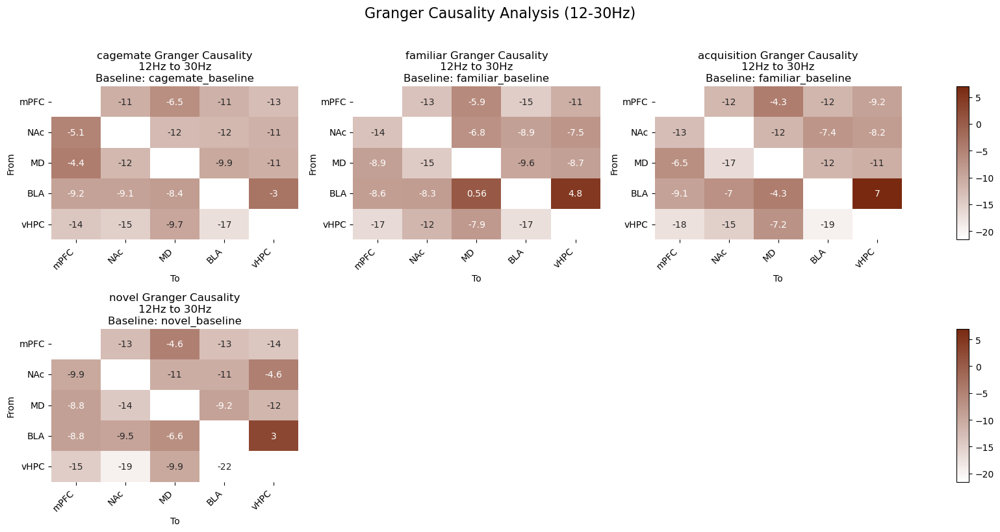

In [22]:
plot_heatmap(cups_collection, events =['cagemate','familiar', 'acquisition', 'novel'],
             baselines = ['cagemate_baseline','familiar_baseline', 'familiar_baseline', 'novel_baseline'],
             freq = (12,30), color = ['white','#792910'] , mode = 'granger')

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:336: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:59: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:61: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:68: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/62760436/ipykernel_2592129/904676634.py:70: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, a

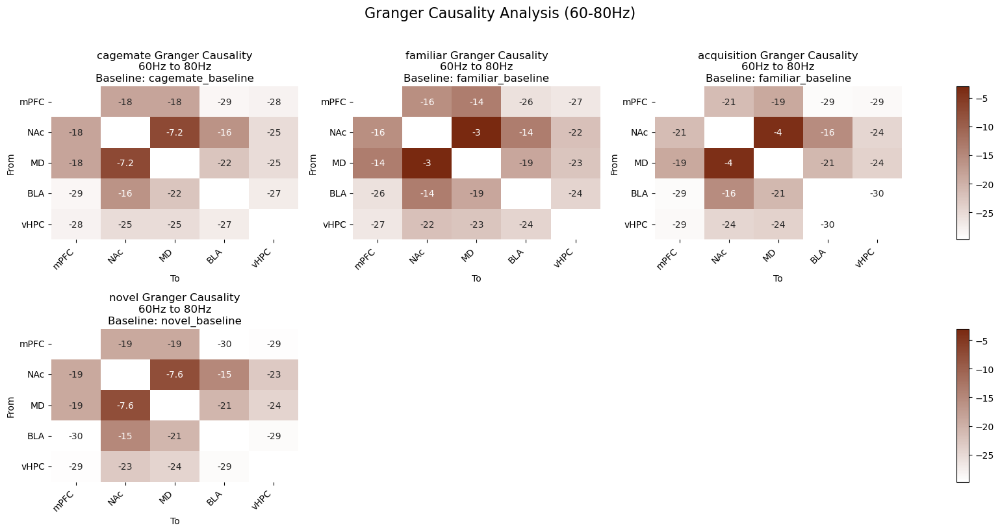

In [23]:
plot_heatmap(cups_collection, events =['cagemate','familiar', 'acquisition', 'novel'],
             baselines = ['cagemate_baseline','familiar_baseline', 'familiar_baseline', 'novel_baseline'],
             freq = (60,80), color = ['white','#792910'] , mode = 'coherence')

In [24]:
from importlib import reload
import itertools
reload(lfpa)
regions_bidict = cups_collection.brain_region_dict
averages = {}
events = ['cagemate','novel', 'familiar']
          
for recording in cups_collection.lfp_recordings: 
    averages[recording.subject] ={}
    for mode in ['power', 'coherence', 'granger']:
        regions = list(regions_bidict.keys())
        event_avg_dict = lfpa.average_events(recording, events = events, mode = mode)
        agent_band_dict, band_agent_dict = lfpa.band_calcs(event_avg_dict)
        for event, bands in agent_band_dict.items():
            for band in bands.keys():
                band_average = np.nanmean(bands[band], axis = 0)
                if mode == 'power':
                    for brain in regions:
                        reg_idx = cups_collection.brain_region_dict[brain]
                        averages[recording.subject][f"{event}_{band}_{brain}_power"] = band_average[reg_idx]
                # For coherence (2D symmetric matrix) - use combinations
                elif mode == 'coherence':
                    # itertools.combinations gives all unique pairs (no repetition, order doesn't matter)
                    for region1, region2 in itertools.combinations(regions, 2):
                        idx1 = cups_collection.brain_region_dict[region1]
                        idx2 = cups_collection.brain_region_dict[region2]
                        averages[recording.subject][f"{event}_{band}_{region1}_{region2}_coherence"] = band_average[idx1, idx2]

                # For Granger (2D directed matrix) - use permutations
                elif mode == 'granger':
                    # itertools.permutations gives all ordered pairs (direction matters)
                    for from_region, to_region in itertools.permutations(regions, 2):
                        from_idx = cups_collection.brain_region_dict[from_region]
                        to_idx = cups_collection.brain_region_dict[to_region]
                        averages[recording.subject][f"{event}_{band}_{from_region}_to_{to_region}_granger"] = band_average[from_idx, to_idx]


/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:411: RuntimeWarning: Mean of empty slice
  delta = np.nanmean(calculations[:, 0:4, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:412: RuntimeWarning: Mean of empty slice
  theta = np.nanmean(calculations[:, 4:13, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:414: RuntimeWarning: Mean of empty slice
  beta = np.nanmean(calculations[:, 13:31, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:416: RuntimeWarning: Mean of empty slice
  low_gamma = np.nanmean(calculations[:, 31:71, ...],

In [25]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
lfp_df = pd.DataFrame.from_dict(averages, orient = 'index')
df_scaled =  pd.DataFrame(
    scaler.fit_transform(lfp_df),
    columns=lfp_df.columns
)

In [26]:
corr_matrix = df_scaled.cov()
corr_matrix


,cagemate_Delta_BLA_power,cagemate_Delta_MD_power,cagemate_Delta_NAc_power,cagemate_Delta_mPFC_power,cagemate_Delta_vHPC_power,cagemate_Theta_BLA_power,cagemate_Theta_MD_power,cagemate_Theta_NAc_power,cagemate_Theta_mPFC_power,cagemate_Theta_vHPC_power,...,familiar_High gamma_NAc_to_mPFC_granger,familiar_High gamma_NAc_to_vHPC_granger,familiar_High gamma_mPFC_to_BLA_granger,familiar_High gamma_mPFC_to_MD_granger,familiar_High gamma_mPFC_to_NAc_granger,familiar_High gamma_mPFC_to_vHPC_granger,familiar_High gamma_vHPC_to_BLA_granger,familiar_High gamma_vHPC_to_MD_granger,familiar_High gamma_vHPC_to_NAc_granger,familiar_High gamma_vHPC_to_mPFC_granger
cagemate_Delta_BLA_power,1.111111,0.639539,0.965894,0.775568,0.856281,-0.022638,-0.313462,-0.167028,-0.280109,-0.518631,...,0.277775,0.391329,0.254563,0.018844,0.098270,0.040219,-0.252427,-0.084854,-0.097012,-0.197568
cagemate_Delta_MD_power,0.639539,1.111111,0.574883,0.215487,0.225096,-0.563117,-0.715464,-0.633953,0.430297,-0.373582,...,0.743360,0.592479,0.570671,0.426089,0.487775,0.366752,-0.075317,0.447697,0.330172,0.324627
cagemate_Delta_NAc_power,0.965894,0.574883,1.111111,1.006246,0.829045,-0.209836,-0.336579,-0.244859,-0.300332,-0.574458,...,0.278168,0.095462,0.050056,-0.156260,-0.001456,-0.070913,-0.146948,-0.245286,-0.215892,-0.339541
cagemate_Delta_mPFC_power,0.775568,0.215487,1.006246,1.111111,0.785790,-0.014000,-0.006916,-0.021448,-0.346854,-0.550384,...,0.029944,-0.023284,-0.095545,-0.250866,-0.276025,-0.121663,0.030646,-0.386755,-0.334487,-0.535186
cagemate_Delta_vHPC_power,0.856281,0.225096,0.829045,0.785790,1.111111,0.046808,-0.138694,0.121712,-0.213834,-0.354457,...,-0.083013,0.070339,-0.041475,-0.204604,-0.083620,0.166601,0.077498,-0.238549,-0.080765,-0.296069
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
familiar_High gamma_mPFC_to_vHPC_granger,0.040219,0.366752,-0.070913,-0.121663,0.166601,-0.241980,-0.019313,0.012063,0.533310,-0.371066,...,0.325995,0.780860,0.063899,0.151884,0.092493,1.111111,0.165251,0.289947,0.225712,0.066495
familiar_High gamma_vHPC_to_BLA_granger,-0.252427,-0.075317,-0.146948,0.030646,0.077498,-0.429804,-0.278242,-0.356713,0.493746,0.224088,...,-0.080511,-0.161088,0.498318,0.667470,0.175473,0.165251,1.111111,0.481771,0.646014,0.340403
familiar_High gamma_vHPC_to_MD_granger,-0.084854,0.447697,-0.245286,-0.386755,-0.238549,-0.554918,-0.342532,-0.722945,0.486727,0.345261,...,0.543269,0.395803,0.641216,0.994527,0.679631,0.289947,0.481771,1.111111,1.062891,1.037157
familiar_High gamma_vHPC_to_NAc_granger,-0.097012,0.330172,-0.215892,-0.334487,-0.080765,-0.613850,-0.429048,-0.727480,0.423421,0.445267,...,0.402926,0.193858,0.587802,0.971185,0.677964,0.225712,0.646014,1.062891,1.111111,1.031280


/blue/npadillacoreano/mcum/conda/envs/lfp_env/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/blue/npadillacoreano/mcum/conda/envs/lfp_env/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<Figure size 4000x4000 with 0 Axes>

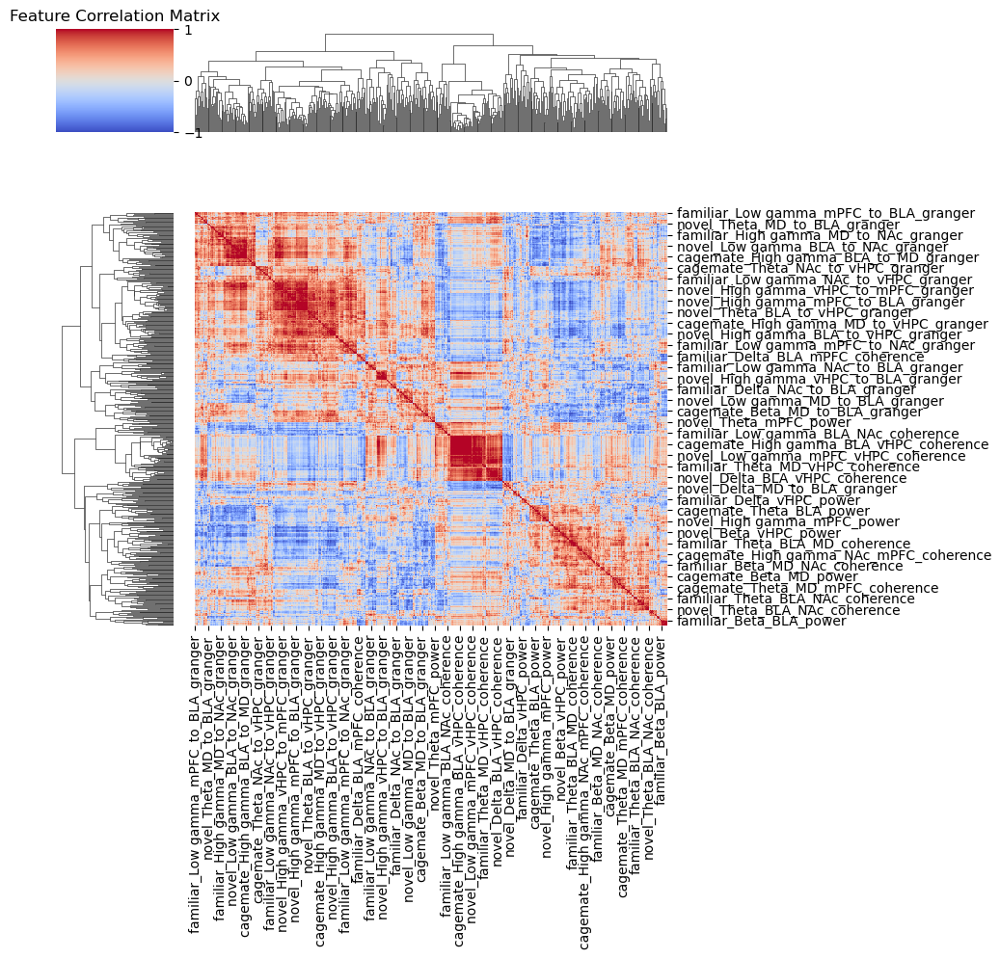

In [27]:
plt.figure(figsize=(40, 40))
corr = sns.clustermap(corr_matrix, annot=False, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Feature Correlation Matrix')
plt.tight_layout()

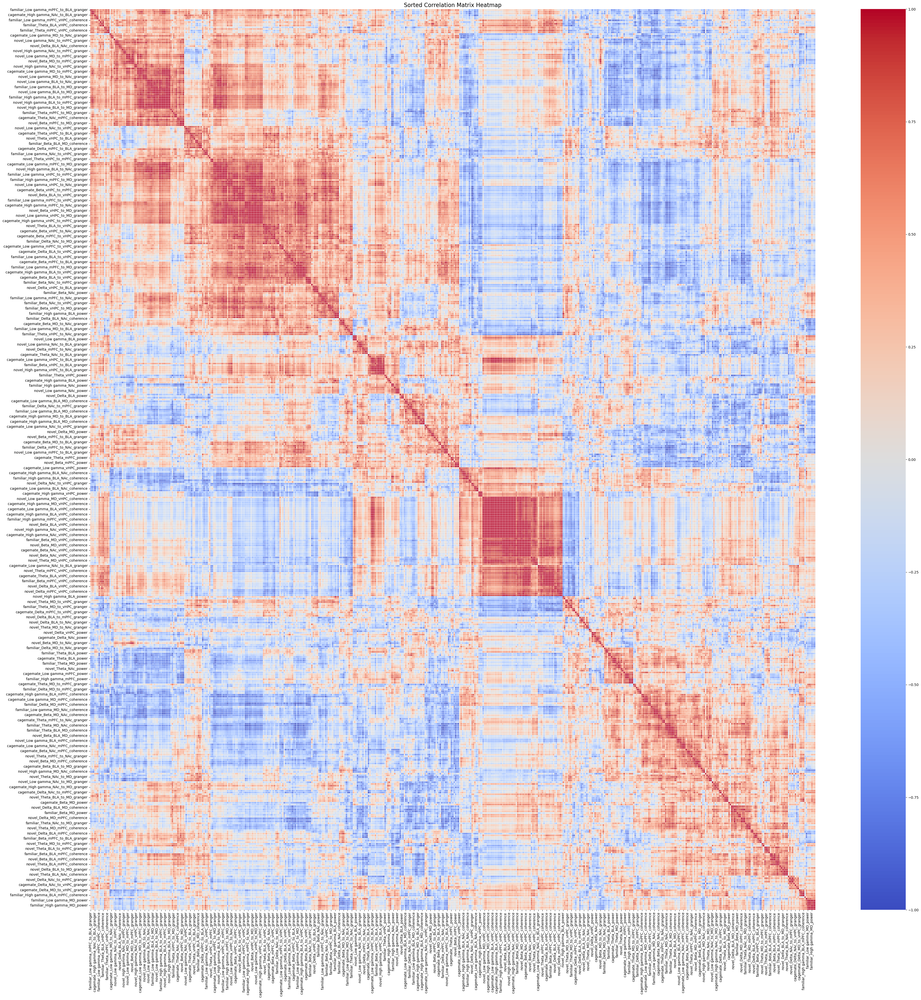

In [28]:
row_order = corr.dendrogram_row.reordered_ind
col_order = corr.dendrogram_col.reordered_ind

# Get the reordered matrix
sorted_corr = corr_matrix.iloc[row_order, col_order]

# Create a standard heatmap with the sorted matrix
plt.figure(figsize=(40, 40))
sns.heatmap(
    sorted_corr,
    cmap='coolwarm',
    annot=False,
    fmt='.2f',
    vmin=-1,
    vmax=1,
    linewidths=0.5
)
plt.title('Sorted Correlation Matrix Heatmap', fontsize=16)
plt.tight_layout()

In [29]:
def identify_feature_groups(corr_matrix, threshold=0.8):
    # Create a copy to avoid modifying the original
    corr_copy = corr_matrix.abs().copy()
    
    # Set diagonal to 0 to avoid self-correlations
    np.fill_diagonal(corr_copy.values, 0)
    
    # Find groups of correlated features
    groups = []
    remaining_features = set(corr_copy.columns)
    
    while remaining_features:
        # Pick a feature
        current_feature = list(remaining_features)[0]
        
        # Find all features correlated with it
        correlated = set(corr_copy.columns[corr_copy[current_feature] > threshold].tolist())
        correlated.add(current_feature)  # Add the feature itself
        
        # If we found a group with at least 2 features
        if len(correlated) > 1:
            groups.append(sorted(correlated))  # Sort for consistent output
            
            # Remove all these features from the remaining set
            remaining_features -= correlated
        else:
            # No correlations found, move to next feature
            remaining_features.remove(current_feature)
    
    return groups

# Identify groups of correlated features
correlated_groups = identify_feature_groups(corr_matrix, threshold=0.8)

  

# Feature selection strategy based on groups
def select_features_from_groups(df, corr_matrix, correlated_groups):
    # Initialize with all features
    selected_features = set(df.columns)
    
    for group in correlated_groups:
        # For demonstration, keep the first feature in each group
        # In practice, you might want to keep the one with highest variance
        # or highest correlation with target
        features_to_remove = group[1:]
        selected_features -= set(features_to_remove)
    
    return list(selected_features)

# Select features
selected_features = select_features_from_groups(lfp_df, corr_matrix, correlated_groups)


In [30]:
from sklearn.feature_selection import mutual_info_regression, SelectKBest
event_iwant = ['cagemate','familiar','novel','empty']
event_info = {}
sniff_itis = []
j = 0
total_sniffs = 0
subject_info = {}

for recording in cups_collection.lfp_recordings:
    subject = recording.subject
    for event, events in recording.behavior_dict.items():
        if event in event_iwant:
            no_events = events.shape[0]
            sniff_length = 0
            for i in range(len(events)):
                sniff_length_temp = events[i][1] - events[i][0]
                sniff_length = sniff_length + sniff_length_temp
                total_sniffs = total_sniffs + 1
                try:
                    sniff_iti = events[i+1][0] - events[i][1]
                    sniff_itis.append(sniff_iti)
                except IndexError:
                    pass
            total_sniff_time = sniff_length/1000
            try:
                avg_event = sniff_length/no_events/1000
            except ZeroDivisionError:
                avg_event = 0
            if subject in event_info.keys():
                dict_event = event_info[subject]
                dict_event[event] =  {'no_events': no_events, 'avg event': avg_event, 'total time': total_sniff_time}
                event_info[subject] =  dict_event
            else:
                event_info[subject] = {event: {'no_events': no_events, 'avg event': avg_event,'total time': total_sniff_time }}
            j += 1
        else:
            pass



    

In [31]:
event_overview = pd.concat({k: pd.DataFrame(v) for k, v in event_info.items()}, axis=0)
event_overview = event_overview.reset_index()

event_overview

,level_0,level_1,familiar,novel,cagemate,empty
0,2.4,no_events,21.000000,57.000000,24.000000,4.000000
1,2.4,avg event,1.746095,2.716947,1.513958,1.316500
2,2.4,total time,36.668000,154.866000,36.335000,5.266000
3,2.3,no_events,29.000000,19.000000,31.000000,29.000000
4,2.3,avg event,4.510241,7.378947,3.941645,3.324034
5,2.3,total time,130.797000,140.200000,122.191000,96.397000
6,2.1,no_events,9.000000,18.000000,49.000000,13.000000
7,2.1,avg event,1.814444,3.103722,7.212000,5.328154
8,2.1,total time,16.330000,55.867000,353.388000,69.266000
9,3.1,no_events,24.000000,59.000000,8.000000,8.000000


In [32]:
event_total_time = event_overview[event_overview['level_1'] == 'total time']
event_total_time['total cup time'] = event_total_time['familiar'] + event_total_time['novel'] + event_total_time['cagemate'] + event_total_time['empty']
event_total_time['cagemate preference']= event_total_time['cagemate'] / event_total_time['total cup time']
event_total_time['familiar preference'] =event_total_time['familiar'] / event_total_time['total cup time']
event_total_time['novel preference'] =event_total_time['novel'] / event_total_time['total cup time']
event_total_time['empty prefernce']= event_total_time['empty'] / event_total_time['total cup time']
event_total_time.index = event_total_time['level_0']
event_total_time = event_total_time.drop(['level_0', 'level_1'], axis = 1)
event_total_time

/scratch/local/62760436/ipykernel_2592129/1272805659.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  event_total_time['total cup time'] = event_total_time['familiar'] + event_total_time['novel'] + event_total_time['cagemate'] + event_total_time['empty']
/scratch/local/62760436/ipykernel_2592129/1272805659.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  event_total_time['cagemate preference']= event_total_time['cagemate'] / event_total_time['total cup time']
/scratch/local/62760436/ipykernel_2592129/

,familiar,novel,cagemate,empty,total cup time,cagemate preference,familiar preference,novel preference,empty prefernce
level_0,,,,,,,,,
2.4,36.668,154.866,36.335,5.266,233.135,0.155854,0.157282,0.664276,0.022588
2.3,130.797,140.200,122.191,96.397,489.585,0.249581,0.267159,0.286365,0.196895
2.1,16.330,55.867,353.388,69.266,494.851,0.714130,0.033000,0.112897,0.139973
3.1,77.932,188.134,28.734,24.599,319.399,0.089963,0.243996,0.589025,0.077017
1.1,7.400,120.868,102.267,42.865,273.400,0.374056,0.027067,0.442092,0.156785
1.3,25.265,61.466,105.463,98.132,290.326,0.363257,0.087023,0.211714,0.338006
4.4,6.665,19.332,512.987,6.332,545.316,0.940715,0.012222,0.035451,0.011612
2.2,15.134,35.533,447.237,26.999,524.903,0.852037,0.028832,0.067694,0.051436
3.2,9.665,71.333,87.866,1.066,169.930,0.517072,0.056876,0.419779,0.006273


In [33]:
lfp_df

,cagemate_Delta_BLA_power,cagemate_Delta_MD_power,cagemate_Delta_NAc_power,cagemate_Delta_mPFC_power,cagemate_Delta_vHPC_power,cagemate_Theta_BLA_power,cagemate_Theta_MD_power,cagemate_Theta_NAc_power,cagemate_Theta_mPFC_power,cagemate_Theta_vHPC_power,...,familiar_High gamma_NAc_to_mPFC_granger,familiar_High gamma_NAc_to_vHPC_granger,familiar_High gamma_mPFC_to_BLA_granger,familiar_High gamma_mPFC_to_MD_granger,familiar_High gamma_mPFC_to_NAc_granger,familiar_High gamma_mPFC_to_vHPC_granger,familiar_High gamma_vHPC_to_BLA_granger,familiar_High gamma_vHPC_to_MD_granger,familiar_High gamma_vHPC_to_NAc_granger,familiar_High gamma_vHPC_to_mPFC_granger
2.4,0.010645,0.015216,0.011772,0.008353,0.012149,0.016442,0.023884,0.023284,0.027374,0.027063,...,0.282235,0.312807,0.279191,0.343875,0.330620,0.307973,0.365641,0.380715,0.426973,0.426868
2.3,0.007626,0.007110,0.011497,0.014386,0.012054,0.024789,0.040004,0.028891,0.024795,0.025788,...,0.269710,0.282189,0.256010,0.279973,0.289330,0.288228,0.363237,0.329181,0.341596,0.348867
2.1,0.020540,0.015573,0.021664,0.021688,0.024330,0.024507,0.030293,0.028318,0.027034,0.026906,...,0.250003,0.306374,0.268247,0.273609,0.277360,0.289694,0.357097,0.315881,0.376969,0.326768
3.1,0.008318,0.014683,0.011671,0.009819,0.010618,0.024711,0.031157,0.029113,0.036575,0.026707,...,0.268028,0.279554,0.291578,0.264648,0.292401,0.281315,0.342353,0.292202,0.283948,0.332685
1.1,0.013397,0.019523,0.015501,0.015505,0.012378,0.018112,0.028568,0.021863,0.037549,0.027061,...,0.301105,0.349826,0.325281,0.462588,0.313751,0.307029,0.539019,0.555072,0.601538,0.551262
1.3,0.012337,0.017275,0.020662,0.020828,0.014385,0.014819,0.026298,0.022267,0.027791,0.025701,...,0.295579,0.276680,0.248688,0.263341,0.297469,0.284633,0.345738,0.319345,0.343540,0.346157
4.4,0.011975,0.010679,0.015460,0.016892,0.011406,0.024266,0.030079,0.025954,0.022496,0.030096,...,0.228066,0.265497,0.271478,0.307705,0.256541,0.243125,0.370978,0.275381,0.289280,0.283085
2.2,0.019276,0.018946,0.021599,0.020368,0.016589,0.016565,0.024416,0.020532,0.024659,0.020867,...,0.338006,0.283117,0.331539,0.370845,0.376596,0.272747,0.348321,0.367087,0.384015,0.404590
3.2,0.008256,0.013203,0.012148,0.010146,0.012786,0.015264,0.024704,0.020316,0.030096,0.031856,...,0.284169,0.244648,0.305243,0.426039,0.367976,0.264854,0.549946,0.530120,0.675902,0.709730
4.1,0.011063,0.011734,0.017005,0.020344,0.017888,0.017604,0.026847,0.025080,0.031225,0.024831,...,0.255106,0.258363,0.297561,0.334119,0.293319,0.290641,0.659694,0.292042,0.377987,0.251426


,Feature,MI_Score
100,familiar_High gamma_MD_mPFC_coherence,0.071111
101,familiar_Beta_MD_NAc_coherence,0.070635
102,familiar_Theta_mPFC_to_NAc_granger,0.069683
103,cagemate_Delta_MD_to_BLA_granger,0.068849
104,novel_Theta_MD_to_NAc_granger,0.068611
...,...,...
520,cagemate_Low gamma_NAc_mPFC_coherence,0.000000
521,cagemate_Beta_BLA_to_NAc_granger,0.000000
522,cagemate_Theta_vHPC_to_mPFC_granger,0.000000
523,cagemate_Theta_vHPC_to_MD_granger,0.000000


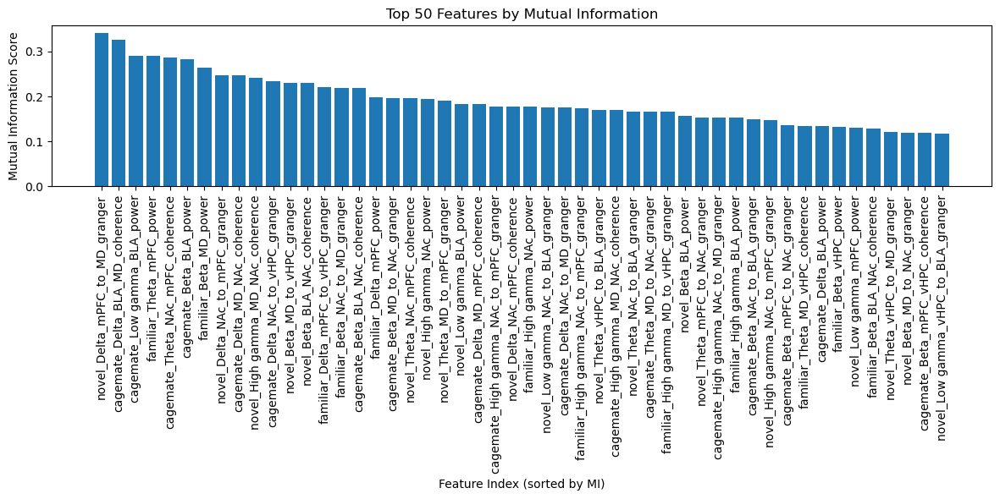

In [55]:
import numpy as np
import pandas as pd
from sklearn.feature_selection import mutual_info_regression
import matplotlib.pyplot as plt

# Assume X contains your 500+ neural features and y is behavioral outcome
# X shape: (n_samples, n_features)
# y shape: (n_samples,)
X = lfp_df 
y = event_total_time['cagemate preference']

# Calculate mutual information between each feature and target
mi_scores = mutual_info_regression(X, y)

# Create DataFrame for better analysis
mi_df = pd.DataFrame({'Feature': X.columns, 
                      'MI_Score': mi_scores})
mi_df = mi_df.sort_values('MI_Score', ascending=False).reset_index(drop=True)

# Visualize MI scores
plt.figure(figsize=(12, 6))
plt.bar(mi_df['Feature'][:50], mi_df['MI_Score'][:50])  # Top 50 features
plt.xlabel('Feature Index (sorted by MI)')
plt.xticks(rotation = 90)
plt.ylabel('Mutual Information Score')
plt.title('Top 50 Features by Mutual Information')
plt.tight_layout()

# Feature grouping by brain region
# Assuming you have region labels for each feature
# region_labels = ['region1', 'region2', ...]  # Your region labels for each feature

# # Add region information
# mi_df['Region'] = [region_labels[i] for i in mi_df['Feature']]

# # Get top features per region
# top_per_region = (mi_df.groupby('Region')
#                      .apply(lambda x: x.nlargest(3, 'MI_Score'))
#                      .reset_index(drop=True))

# print("Top 3 features per brain region:")
# print(top_per_region)

# Select top k features based on MI scores
# def select_top_mi_features(X, y, k=50):
#     mi_scores = mutual_info_regression(X, y)
#     top_indices = np.argsort(mi_scores)[-k:]  # Get indices of top k features
#     return X[:, top_indices], top_indices

#X_selected, selected_indices = select_top_mi_features(X, y, k=50)
mi_df[100:]

,Feature,MI_Score
0,familiar_Theta_mPFC_power,0.583968
1,novel_Theta_mPFC_power,0.453968
2,familiar_Theta_mPFC_to_BLA_granger,0.403968
3,cagemate_Delta_mPFC_power,0.395635
4,cagemate_Low gamma_MD_to_NAc_granger,0.387302
5,cagemate_Low gamma_BLA_NAc_coherence,0.384683
6,cagemate_Beta_mPFC_power,0.367302
7,novel_Beta_MD_NAc_coherence,0.355635
8,cagemate_High gamma_mPFC_to_vHPC_granger,0.342183
9,cagemate_Theta_vHPC_to_MD_granger,0.333968


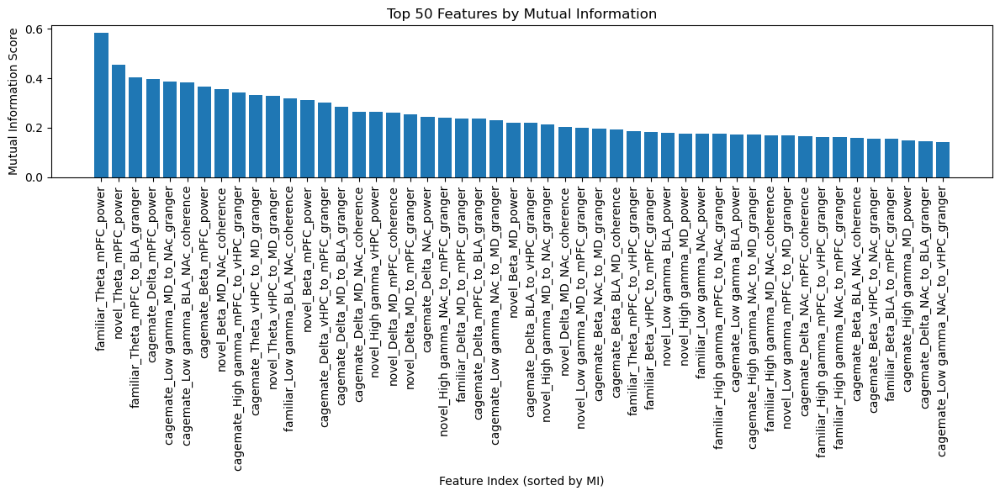

In [35]:
y = event_total_time['novel preference']

# Calculate mutual information between each feature and target
mi_scores = mutual_info_regression(X, y)

# Create DataFrame for better analysis
mi_df = pd.DataFrame({'Feature': X.columns, 
                      'MI_Score': mi_scores})
mi_df = mi_df.sort_values('MI_Score', ascending=False).reset_index(drop=True)

# Visualize MI scores
plt.figure(figsize=(12, 6))
plt.bar(mi_df['Feature'][:50], mi_df['MI_Score'][:50])  # Top 50 features
plt.xlabel('Feature Index (sorted by MI)')
plt.xticks(rotation = 90)
plt.ylabel('Mutual Information Score')
plt.title('Top 50 Features by Mutual Information')
plt.tight_layout()

# Feature grouping by brain region
# Assuming you have region labels for each feature
# region_labels = ['region1', 'region2', ...]  # Your region labels for each feature

# # Add region information
# mi_df['Region'] = [region_labels[i] for i in mi_df['Feature']]

# # Get top features per region
# top_per_region = (mi_df.groupby('Region')
#                      .apply(lambda x: x.nlargest(3, 'MI_Score'))
#                      .reset_index(drop=True))

# print("Top 3 features per brain region:")
# print(top_per_region)

# Select top k features based on MI scores
# def select_top_mi_features(X, y, k=50):
#     mi_scores = mutual_info_regression(X, y)
#     top_indices = np.argsort(mi_scores)[-k:]  # Get indices of top k features
#     return X[:, top_indices], top_indices

#X_selected, selected_indices = select_top_mi_features(X, y, k=50)
mi_df[:50]

,Feature,MI_Score
0,cagemate_Delta_BLA_to_NAc_granger,0.409683
1,cagemate_Beta_MD_to_NAc_granger,0.358968
2,familiar_Low gamma_BLA_power,0.348849
3,familiar_Theta_MD_mPFC_coherence,0.317778
4,novel_Delta_NAc_to_mPFC_granger,0.294167
5,familiar_Low gamma_NAc_to_MD_granger,0.286230
6,cagemate_Delta_mPFC_to_vHPC_granger,0.273968
7,novel_Beta_MD_to_vHPC_granger,0.272302
8,novel_Low gamma_mPFC_vHPC_coherence,0.249048
9,cagemate_Low gamma_mPFC_power,0.247302


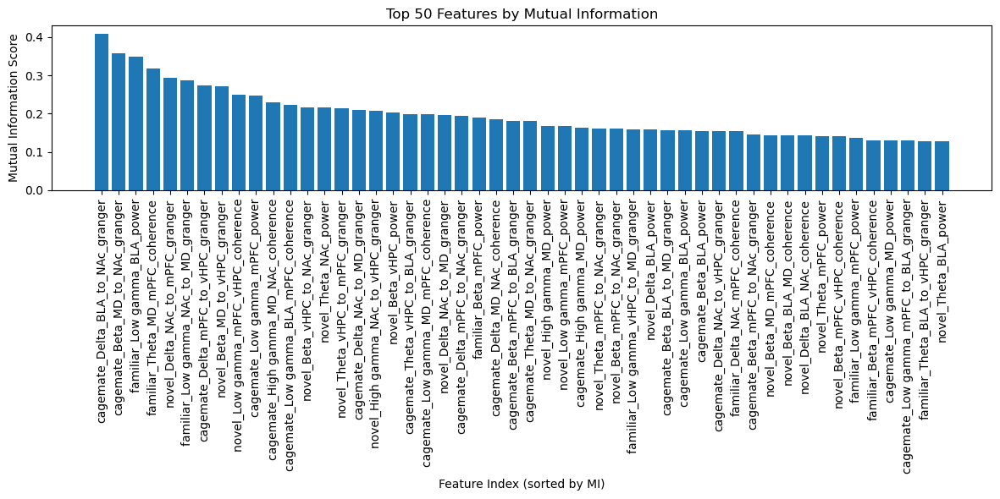

In [36]:
y = event_total_time['familiar preference']

# Calculate mutual information between each feature and target
mi_scores = mutual_info_regression(X, y)

# Create DataFrame for better analysis
mi_df = pd.DataFrame({'Feature': X.columns, 
                      'MI_Score': mi_scores})
mi_df = mi_df.sort_values('MI_Score', ascending=False).reset_index(drop=True)

# Visualize MI scores
plt.figure(figsize=(12, 6))
plt.bar(mi_df['Feature'][:50], mi_df['MI_Score'][:50])  # Top 50 features
plt.xlabel('Feature Index (sorted by MI)')
plt.xticks(rotation = 90)
plt.ylabel('Mutual Information Score')
plt.title('Top 50 Features by Mutual Information')
plt.tight_layout()

# Feature grouping by brain region
# Assuming you have region labels for each feature
# region_labels = ['region1', 'region2', ...]  # Your region labels for each feature

# # Add region information
# mi_df['Region'] = [region_labels[i] for i in mi_df['Feature']]

# # Get top features per region
# top_per_region = (mi_df.groupby('Region')
#                      .apply(lambda x: x.nlargest(3, 'MI_Score'))
#                      .reset_index(drop=True))

# print("Top 3 features per brain region:")
# print(top_per_region)

# Select top k features based on MI scores
# def select_top_mi_features(X, y, k=50):
#     mi_scores = mutual_info_regression(X, y)
#     top_indices = np.argsort(mi_scores)[-k:]  # Get indices of top k features
#     return X[:, top_indices], top_indices

#X_selected, selected_indices = select_top_mi_features(X, y, k=50)
mi_df[:50]